## Neural Network

In [5]:
# This UNET-style prediction model was originally included as part of the Score-based generative modelling tutorial
# by Yang Song et al: https://colab.research.google.com/drive/120kYYBOVa1i0TD85RjlEkFjaWDxSFUx3?usp=sharing

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

class GaussianFourierProjection(nn.Module):
  """Gaussian random features for encoding time steps."""
  def __init__(self, embed_dim, scale=30.):
    super().__init__()
    # Randomly sample weights during initialization. These weights are fixed
    # during optimization and are not trainable.
    self.W = nn.Parameter(torch.randn(embed_dim // 2) * scale, requires_grad=False)
  def forward(self, x):
    x_proj = x[:, None] * self.W[None, :] * 2 * np.pi
    return torch.cat([torch.sin(x_proj), torch.cos(x_proj)], dim=-1)


class Dense(nn.Module):
  """A fully connected layer that reshapes outputs to feature maps."""
  def __init__(self, input_dim, output_dim):
    super().__init__()
    self.dense = nn.Linear(input_dim, output_dim)
  def forward(self, x):
    return self.dense(x)[..., None, None]


class ScoreNet(nn.Module):
  """A time-dependent score-based model built upon U-Net architecture."""

  def __init__(self, marginal_prob_std, channels=[32, 64, 128, 256], embed_dim=256):
    """Initialize a time-dependent score-based network.

    Args:
      marginal_prob_std: A function that takes time t and gives the standard
        deviation of the perturbation kernel p_{0t}(x(t) | x(0)).
      channels: The number of channels for feature maps of each resolution.
      embed_dim: The dimensionality of Gaussian random feature embeddings.
    """
    super().__init__()
    # Gaussian random feature embedding layer for time
    self.embed = nn.Sequential(GaussianFourierProjection(embed_dim=embed_dim),
         nn.Linear(embed_dim, embed_dim))
    # Encoding layers where the resolution decreases
    self.conv1 = nn.Conv2d(1, channels[0], 3, stride=1, bias=False)
    self.dense1 = Dense(embed_dim, channels[0])
    self.gnorm1 = nn.GroupNorm(4, num_channels=channels[0])
    self.conv2 = nn.Conv2d(channels[0], channels[1], 3, stride=2, bias=False)
    self.dense2 = Dense(embed_dim, channels[1])
    self.gnorm2 = nn.GroupNorm(32, num_channels=channels[1])
    self.conv3 = nn.Conv2d(channels[1], channels[2], 3, stride=2, bias=False)
    self.dense3 = Dense(embed_dim, channels[2])
    self.gnorm3 = nn.GroupNorm(32, num_channels=channels[2])
    self.conv4 = nn.Conv2d(channels[2], channels[3], 3, stride=2, bias=False)
    self.dense4 = Dense(embed_dim, channels[3])
    self.gnorm4 = nn.GroupNorm(32, num_channels=channels[3])

    # Decoding layers where the resolution increases
    self.tconv4 = nn.ConvTranspose2d(channels[3], channels[2], 3, stride=2, bias=False)
    self.dense5 = Dense(embed_dim, channels[2])
    self.tgnorm4 = nn.GroupNorm(32, num_channels=channels[2])
    self.tconv3 = nn.ConvTranspose2d(channels[2] + channels[2], channels[1], 3, stride=2, bias=False, output_padding=1)
    self.dense6 = Dense(embed_dim, channels[1])
    self.tgnorm3 = nn.GroupNorm(32, num_channels=channels[1])
    self.tconv2 = nn.ConvTranspose2d(channels[1] + channels[1], channels[0], 3, stride=2, bias=False, output_padding=1)
    self.dense7 = Dense(embed_dim, channels[0])
    self.tgnorm2 = nn.GroupNorm(32, num_channels=channels[0])
    self.tconv1 = nn.ConvTranspose2d(channels[0] + channels[0], 1, 3, stride=1)

    # The swish activation function
    self.act = lambda x: x * torch.sigmoid(x)
    self.marginal_prob_std = marginal_prob_std

  def forward(self, x, t, alpha_t=None, beta_t=None, alpha_bar_t=None, target='eps'):
    """
    Forward pass for the ScoreNet.

    Parameters
    ----------
    x : torch.Tensor
        Noisy input at time step t.
    t : torch.Tensor
        Current timestep t.
    alpha_t : torch.Tensor, optional
        Alpha value for timestep t.
    beta_t : torch.Tensor, optional
        Beta value for timestep t.
    alpha_bar_t : torch.Tensor, optional
        Alpha bar value (cumulative product) for timestep t.
    target : str, optional
        The prediction target: 'epsilon', 'mu', or 'x0'.

    Returns
    -------
    torch.Tensor
        Predicted output based on the target.
    """
    # Obtain the Gaussian random feature embedding for t
    embed = self.act(self.embed(t))
    # Encoding path
    h1 = self.conv1(x)
    ## Incorporate information from t
    h1 += self.dense1(embed)
    ## Group normalization
    h1 = self.gnorm1(h1)
    h1 = self.act(h1)
    h2 = self.conv2(h1)
    h2 += self.dense2(embed)
    h2 = self.gnorm2(h2)
    h2 = self.act(h2)
    h3 = self.conv3(h2)
    h3 += self.dense3(embed)
    h3 = self.gnorm3(h3)
    h3 = self.act(h3)
    h4 = self.conv4(h3)
    h4 += self.dense4(embed)
    h4 = self.gnorm4(h4)
    h4 = self.act(h4)

    # Decoding path
    h = self.tconv4(h4)
    ## Skip connection from the encoding path
    h += self.dense5(embed)
    h = self.tgnorm4(h)
    h = self.act(h)
    h = self.tconv3(torch.cat([h, h3], dim=1))
    h += self.dense6(embed)
    h = self.tgnorm3(h)
    h = self.act(h)
    h = self.tconv2(torch.cat([h, h2], dim=1))
    h += self.dense7(embed)
    h = self.tgnorm2(h)
    h = self.act(h)
    h = self.tconv1(torch.cat([h, h1], dim=1))

    # Normalize output
    h = h / self.marginal_prob_std(t)[:, None, None, None]

    # Post-processing step based on target parameterization (epsilon, mu, or x0)
    if target == 'eps':  # Default (noise level)
        return h

    elif target == 'mu': # Computes mu using diffusion formulas

        if alpha_t is None or beta_t is None or alpha_bar_t is None:
            raise ValueError("alpha_t, beta_t, and alpha_bar_t must be provided for target='mu'")

        # Broadcast parameters to match spatial dimensions
        alpha_t = alpha_t[:, None, None, None]
        beta_t = beta_t[:, None, None, None]
        alpha_bar_t = alpha_bar_t[:, None, None, None]

        mu = (1 / torch.sqrt(alpha_t)) * (x - (beta_t / torch.sqrt(1 - alpha_bar_t)) * h) # mu based on epsilon (default output of the network)

        ## FOR DEBBUGING: Checking intermediate mu stats
        #if torch.any(torch.isnan(mu)) or torch.any(torch.isinf(mu)):
        #  print(f"NaN or Inf detected in mu computation: alpha_t={alpha_t.mean().item()}, beta_t={beta_t.mean().item()}, h={h.mean().item()}")
        #else:
        #  print(f"mu stats - mean: {mu.mean().item()}, std: {mu.std().item()}, range: {mu.min().item()} to {mu.max().item()}")

        return mu

    elif target == 'x0':  # Computes x0 using diffusion formulas

        if alpha_bar_t is None:
            raise ValueError("alpha_bar_t must be provided for target='x0'")

        ## FOR DEBUGGING
        # print(f"x shape: {x.shape}")  # Should be [batch_size, 1, 28, 28]
        # print(f"h shape: {h.shape}")  # Should be [batch_size, 1, 28, 28]
        # print(f"alpha_bar_t shape before broadcasting: {alpha_bar_t.shape}")  # Should match [batch_size, 1, 1, 1]

        # Fix broadcasting to ensure correct shape
        alpha_bar_t = alpha_bar_t.view(-1, 1, 1, 1)  # Explicitly reshape to [batch_size, 1, 1, 1]

        ## FOR DEBUGGING (should be [256, 1, 1, 1])
        # print(f"alpha_bar_t shape after broadcasting: {alpha_bar_t.shape}")

        x0 = (x - torch.sqrt(1 - alpha_bar_t) * h) / torch.sqrt(alpha_bar_t) # x0 based on epsilon (default output of the network)

        ## FOR DEBUGGING (check final shape)
        # print(f"x0 shape: {x0.shape}")

        return x0

### EMA Implementation

In [6]:
# ExponentialMovingAverage implementation as used in pytorch vision
# https://github.com/pytorch/vision/blob/main/references/classification/utils.py#L159

# BSD 3-Clause License

# Copyright (c) Soumith Chintala 2016,
# All rights reserved.

# Redistribution and use in source and binary forms, with or without
# modification, are permitted provided that the following conditions are met:

# * Redistributions of source code must retain the above copyright notice, this
#   list of conditions and the following disclaimer.

# * Redistributions in binary form must reproduce the above copyright notice,
#   this list of conditions and the following disclaimer in the documentation
#   and/or other materials provided with the distribution.

# * Neither the name of the copyright holder nor the names of its
#   contributors may be used to endorse or promote products derived from
#   this software without specific prior written permission.

# THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS "AS IS"
# AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE
# IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE ARE
# DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER OR CONTRIBUTORS BE LIABLE
# FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL
# DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE GOODS OR
# SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER
# CAUSED AND ON ANY THEORY OF LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY,
# OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY OUT OF THE USE
# OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.

class ExponentialMovingAverage(torch.optim.swa_utils.AveragedModel):
    """Maintains moving averages of model parameters using an exponential decay.
    ``ema_avg = decay * avg_model_param + (1 - decay) * model_param``
    `torch.optim.swa_utils.AveragedModel <https://pytorch.org/docs/stable/optim.html#custom-averaging-strategies>`_
    is used to compute the EMA.
    """

    def __init__(self, model, decay, device="cpu"):
        def ema_avg(avg_model_param, model_param, num_averaged):
            return decay * avg_model_param + (1 - decay) * model_param

        super().__init__(model, device, ema_avg, use_buffers=True)

## DDPM

In [7]:
from torchvision import datasets, transforms, utils
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import math

class DDPM(nn.Module):

    def __init__(self, network, T=100, beta_1=1e-4, beta_T=2e-2, target="eps"):
        """
        Initialize Denoising Diffusion Probabilistic Model.

        Parameters
        ----------
        target: str
            The type of prediction the model outputs.
            Options:
              - "eps" (default): Predicts noise.
              - "x0": Predicts the original clean image.
              - "mu": Predicts the mean of the reverse process.
        """
        super(DDPM, self).__init__()

        self._network = network
        self.network = lambda x, t, **kwargs: (self._network(x.reshape(-1, 1, 28, 28),
                                                     (t.squeeze() / T),
                                                     **kwargs)
                                       ).reshape(-1, 28 * 28)


        self.T = T
        self.target = target  # Sets the type of parameterization used for denoising
        self.register_buffer("beta", torch.linspace(beta_1, beta_T, T+1))
        self.register_buffer("alpha", 1-self.beta)
        self.register_buffer("alpha_bar", self.alpha.cumprod(dim=0))

    def forward_diffusion(self, x0, t, epsilon):
        """
        q(x_t | x_0)
        Forward diffusion from an input datapoint x0 to an xt at timestep t, provided a N(0,1) noise sample epsilon.
        Note that we can do this operation in a single step

        Parameters
        ----------
        x0: torch.tensor
            x value at t=0 (an input image)
        t: int
            step index
        epsilon:
            noise sample

        Returns
        -------
        torch.tensor
            image at timestep t
        """

        mean = torch.sqrt(self.alpha_bar[t])*x0
        std = torch.sqrt(1 - self.alpha_bar[t])

        return mean + std*epsilon

    def reverse_diffusion(self, xt, t, epsilon, target='eps'):
        """
        Reverse diffusion step: p(x_{t-1} | x_t)
        """
        # Convert t to integer index and reshape as needed
        t_int = t.squeeze().long()

        # Retrieve corresponding alpha, beta, and alpha_bar values
        alpha_t = self.alpha[t_int].view(-1, 1).to(xt.device)
        beta_t = self.beta[t_int].view(-1, 1).to(xt.device)
        alpha_bar_t = self.alpha_bar[t_int].view(-1, 1).to(xt.device)

        # Predict based on the selected target parameter
        if target == 'eps':  # Predict noise epsilon (default)
            pred = self.network(xt, t)

        elif target == 'mu':  # Predict mean mu
            pred = self._network(xt.view(-1, 1, 28, 28), t / self.T, alpha_t=alpha_t, beta_t=beta_t, alpha_bar_t=alpha_bar_t, target='mu').view(-1, 28*28)

        elif target == 'x0':  # Predict x0
            pred = self._network(xt.view(-1, 1, 28, 28), t / self.T, alpha_bar_t=alpha_bar_t, target='x0').view(-1, 28*28)

        else:
            raise ValueError(f"Unsupported target parameterization: {target}")

        # Calculate mean and standard deviation for the reverse process
        mean = (1 / torch.sqrt(alpha_t)) * (xt - (beta_t / torch.sqrt(1 - alpha_bar_t)) * pred)
        std = torch.where(t > 1, torch.sqrt(((1 - alpha_bar_t) / (1 - alpha_bar_t)) * beta_t), torch.zeros_like(beta_t))

        return mean + std * epsilon


    @torch.no_grad()
    def sample(self, shape):
        """
        Sample from diffusion model (Algorithm 2 in Ho et al, 2020)

        Parameters
        ----------
        shape: tuple
            Specify shape of sampled output. For MNIST: (nsamples, 28*28)

        Returns
        -------
        torch.tensor
            sampled image
        """

        # Sample xT: Gaussian noise
        xT = torch.randn(shape).to(self.beta.device)

        xt = xT
        for t in range(self.T, 0, -1):
            noise = torch.randn_like(xT) if t > 1 else 0
            t = torch.tensor(t).expand(xt.shape[0], 1).to(self.beta.device)
            xt = self.reverse_diffusion(xt, t, noise)

        return xt

    def elbo_simple(self, x0, target='eps'):
        """
        ELBO training objective (Algorithm 1 in Ho et al, 2020).

        Parameters
        ----------
        x0: torch.tensor
            Input image.
        target: str
            Specifies the prediction target ('eps', 'x0', 'mu').

        Returns
        -------
        float
            ELBO value.
        """
        # Sample time step t
        t = torch.randint(1, self.T, (x0.shape[0], 1)).to(x0.device)
        epsilon = torch.randn_like(x0)

        # Forward diffusion to produce x_t
        xt = self.forward_diffusion(x0, t, epsilon)

        # Retrieve alphas and betas for the current timestep
        t_int = t.squeeze().long()
        alpha_t = self.alpha[t_int].view(-1, 1).to(x0.device)
        beta_t = self.beta[t_int].view(-1, 1).to(x0.device)
        alpha_bar_t = self.alpha_bar[t_int].view(-1, 1).to(x0.device)

        if target == 'eps':  # Predict noise epsilon
            # Noise prediction loss
            eps_pred = self.network(xt, t)
            return -nn.MSELoss(reduction='mean')(epsilon, eps_pred)

        elif target == "x0":
            # Broadcast parameters to match spatial dimensions
            alpha_bar_t = alpha_bar_t.view(-1, 1, 1, 1)  # Explicitly reshape to [batch_size, 1, 1, 1]

            # Predict x0 using the network
            x0_pred = self.network(xt, t, alpha_bar_t=alpha_bar_t, target='x0')

            ## FOR DEBUGGING
            # print(f"x0_pred shape after network: {x0_pred.shape}")
            # print(f"x0 shape: {x0.shape}")         # Actual x0 shape
            # print(f"x0_pred shape: {x0_pred.shape}")  # Predicted x0 shape

            # Flatten x0_pred to match x0's shape
            x0_pred = x0_pred.view(x0.shape)

            # Compute the loss by comparing the predicted x0 with actual x0
            return -nn.MSELoss(reduction='mean')(x0_pred, x0)

        elif target == "mu":
            # Broadcast parameters to match spatial dimensions
            alpha_t = alpha_t[:, None]
            beta_t = beta_t[:, None]
            alpha_bar_t = alpha_bar_t[:, None]

            # Predict mu using the network
            mu_pred = self.network(xt, t, alpha_t=alpha_t, beta_t=beta_t, alpha_bar_t=alpha_bar_t, target='mu')

            # Compute the true mean of the reverse process
            mu_true = (1. / torch.sqrt(alpha_t)) * (xt - (beta_t / torch.sqrt(1 - alpha_bar_t)) * epsilon)

            # Reshape mu_true to match mu_pred
            mu_true = mu_true.view(mu_pred.shape)

            ## FOR DEBUGGING: Checking the ranges and values of mu_pred and mu_true
            # print(f"mu_pred stats - mean: {mu_pred.mean().item()}, std: {mu_pred.std().item()}, range: {mu_pred.min().item()} to {mu_pred.max().item()}")
            # print(f"mu_true stats - mean: {mu_true.mean().item()}, std: {mu_true.std().item()}, range: {mu_true.min().item()} to {mu_true.max().item()}")

            # Compute the loss by comparing the predicted mu with actual mu
            return -nn.MSELoss(reduction='mean')(mu_pred, mu_true)

        else:
            raise ValueError(f"Unsupported prediction_type: {target}")


    def loss(self, x0, target='eps'):
        """
        Loss function. Just the negative of the ELBO.

        Parameters
        ----------
        x0: torch.tensor
            Input image.
        target: str
            Specifies the prediction target ('eps', 'x0', 'mu').

        Returns
        -------
        torch.tensor
            The loss value.
        """
        return -self.elbo_simple(x0, target=target).mean()


def train(model, optimizer, scheduler, dataloader, epochs, device, ema=True, per_epoch_callback=None, target="eps"):
    """
    Training loop with loss logging and plotting.

    Parameters
    ----------
    model: nn.Module
        Pytorch model
    optimizer: optim.Optimizer
        Pytorch optimizer to be used for training
    scheduler: optim.LRScheduler
        Pytorch learning rate scheduler
    dataloader: utils.DataLoader
        Pytorch dataloader
    epochs: int
        Number of epochs to train
    device: torch.device
        Pytorch device specification
    ema: Boolean
        Whether to activate Exponential Model Averaging
    per_epoch_callback: function
        Called at the end of every epoch
    target: str
            Specifies the prediction target ('eps', 'x0', 'mu')
    """
    # Setup progress bar
    total_steps = len(dataloader) * epochs
    progress_bar = tqdm(range(total_steps), desc="Training")

    # Initialize Exponential Moving Average if enabled
    if ema:
        ema_global_step_counter = 0
        ema_steps = 10
        ema_adjust = dataloader.batch_size * ema_steps / epochs
        ema_decay = 1.0 - 0.995
        ema_alpha = min(1.0, (1.0 - ema_decay) * ema_adjust)
        ema_model = ExponentialMovingAverage(model, device=device, decay=1.0 - ema_alpha)

    # To store loss history for plotting
    loss_history = []

    for epoch in range(epochs):
        # Switch to train mode
        model.train()
        epoch_loss = 0  # To accumulate loss for each epoch

        for i, (x, _) in enumerate(dataloader):
            x = x.to(device)
            optimizer.zero_grad()
            loss = model.loss(x, target=target)
            loss.backward()

            ## FOR DEBUGGING: Print loss stats every few iterations
            # if i % 100 == 0:
              # print(f"[Epoch {epoch+1}, Step {i}] Loss: {loss.item():.4f}")

             # Gradient clipping to improve training stability for all parameterizations
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            scheduler.step()

            # Accumulate loss for the epoch
            epoch_loss += loss.item()

            # Update progress bar
            progress_bar.set_postfix(loss=f"\u2800{loss.item():12.4f}", epoch=f"{epoch+1}/{epochs}", lr=f"{scheduler.get_last_lr()[0]:.2E}")
            progress_bar.update()

            if ema:
                ema_global_step_counter += 1
                if ema_global_step_counter % ema_steps == 0:
                    ema_model.update_parameters(model)

        # Store the average loss for the epoch
        avg_epoch_loss = epoch_loss / len(dataloader)
        loss_history.append(avg_epoch_loss)
        print(f"Epoch {epoch + 1}/{epochs}, Avg Loss: {avg_epoch_loss:.4f}")

        # Run the per-epoch callback if provided
        if per_epoch_callback:
            per_epoch_callback(ema_model.module if ema else model)

    # Plot training loss
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, epochs + 1), loss_history, label="Training Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title(f"Training Loss Over Epochs ({target} parameterization)")
    plt.legend()
    plt.grid()
    plt.show()


# Parameters
T = 1000
learning_rate = 1e-3
epochs = 100
batch_size = 256

# Rather than treating MNIST images as discrete objects, as done in Ho et al 2020,
# we here treat them as continuous input data, by dequantizing the pixel values (adding noise to the input data)
# Also note that we map the 0..255 pixel values to [-1, 1], and that we process the 28x28 pixel values as a flattened 784 tensor.
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x + torch.rand(x.shape)/255),    # Dequantize pixel values
    transforms.Lambda(lambda x: (x-0.5)*2.0),                    # Map from [0,1] -> [-1, -1]
    transforms.Lambda(lambda x: x.flatten())
])

# Download and transform train dataset
dataloader_train = torch.utils.data.DataLoader(datasets.MNIST('./mnist_data', download=True, train=True, transform=transform),
                                                batch_size=batch_size,
                                                shuffle=True)

# Select device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Construct Unet
# The original ScoreNet expects a function with std for all the
# different noise levels, such that the output can be rescaled.
# Since we are predicting the noise (rather than the score), we
# ignore this rescaling and just set std=1 for all t.

# Create separate UNet instances for each parameterization
mnist_unet_eps = ScoreNet((lambda t: torch.ones(1).to(device)))
mnist_unet_mu = ScoreNet((lambda t: torch.ones(1).to(device)))
mnist_unet_x0 = ScoreNet((lambda t: torch.ones(1).to(device)))

# Constructing separate model instances for each parameterization
model_eps = DDPM(network = mnist_unet_eps, T=T).to(device)
model_mu = DDPM(network = mnist_unet_mu, T=T).to(device)
model_x0 = DDPM(network = mnist_unet_x0, T=T).to(device)

# Constructing separate optimizers for each parameterization
optimizer_eps = torch.optim.Adam(model_eps.parameters(), lr=learning_rate)
optimizer_mu = torch.optim.Adam(model_mu.parameters(), lr=learning_rate)
optimizer_x0 = torch.optim.Adam(model_x0.parameters(), lr=learning_rate)

# Setup separate simple schedulers for each parameterization
scheduler_eps = torch.optim.lr_scheduler.ExponentialLR(optimizer_eps, 0.9999)
scheduler_mu = torch.optim.lr_scheduler.ExponentialLR(optimizer_mu, 0.9999)
scheduler_x0 = torch.optim.lr_scheduler.ExponentialLR(optimizer_x0, 0.9999)

def reporter(model, target="eps"):
    """Callback function used for plotting images during training"""

    # Switch to eval mode
    model.eval()

    with torch.no_grad():
        nsamples = 10
        samples = model.sample((nsamples,28*28)).cpu()

        # Map pixel values back from [-1,1] to [0,1]
        samples = (samples+1)/2
        samples = samples.clamp(0.0, 1.0)

        # Plot in grid
        grid = utils.make_grid(samples.reshape(-1, 1, 28, 28), nrow=nsamples)
        plt.gca().set_axis_off()
        plt.imshow(transforms.functional.to_pil_image(grid), cmap="gray")
        plt.show()

Using downloaded and verified file: ./mnist_data/MNIST/raw/train-images-idx3-ubyte.gz
Extracting ./mnist_data/MNIST/raw/train-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
<urlopen error [Errno 110] Connection timed out>



100%|██████████| 28.9k/28.9k [00:00<00:00, 290kB/s]


Extracting ./mnist_data/MNIST/raw/train-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
<urlopen error [Errno 110] Connection timed out>



100%|██████████| 1.65M/1.65M [00:00<00:00, 2.71MB/s]


Extracting ./mnist_data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
<urlopen error [Errno 110] Connection timed out>



100%|██████████| 4.54k/4.54k [00:00<00:00, 16.1MB/s]


Extracting ./mnist_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



## Training Loops

### Target: Epsilon (noise level)

Training:   0%|          | 0/23500 [00:00<?, ?it/s]

Epoch 1/100, Avg Loss: 0.3215


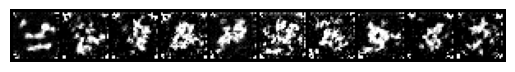

Epoch 2/100, Avg Loss: 0.0724


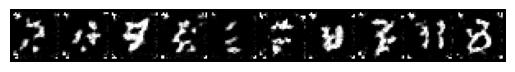

Epoch 3/100, Avg Loss: 0.0596


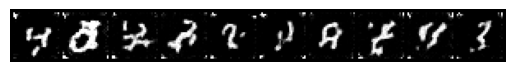

Epoch 4/100, Avg Loss: 0.0541


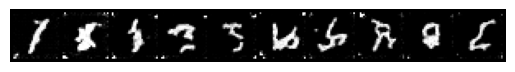

Epoch 5/100, Avg Loss: 0.0505


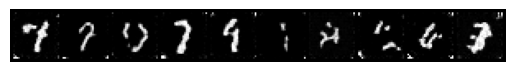

Epoch 6/100, Avg Loss: 0.0477


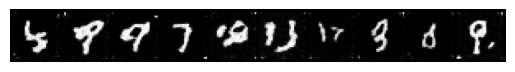

Epoch 7/100, Avg Loss: 0.0453


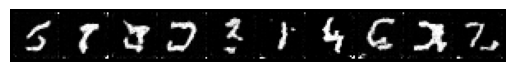

Epoch 8/100, Avg Loss: 0.0439


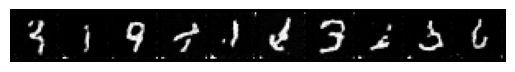

Epoch 9/100, Avg Loss: 0.0422


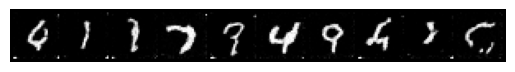

Epoch 10/100, Avg Loss: 0.0414


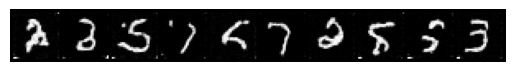

Epoch 11/100, Avg Loss: 0.0395


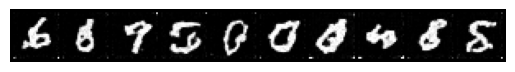

Epoch 12/100, Avg Loss: 0.0392


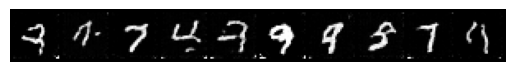

Epoch 13/100, Avg Loss: 0.0394


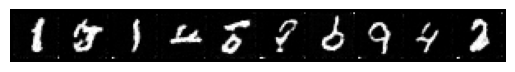

Epoch 14/100, Avg Loss: 0.0380


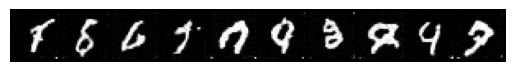

Epoch 15/100, Avg Loss: 0.0378


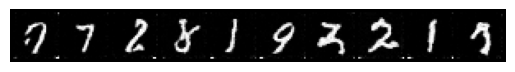

Epoch 16/100, Avg Loss: 0.0370


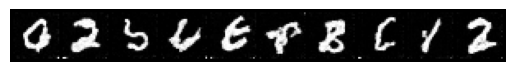

Epoch 17/100, Avg Loss: 0.0367


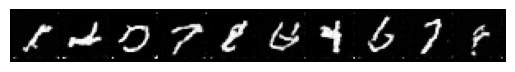

Epoch 18/100, Avg Loss: 0.0361


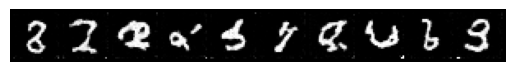

Epoch 19/100, Avg Loss: 0.0362


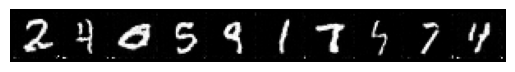

Epoch 20/100, Avg Loss: 0.0356


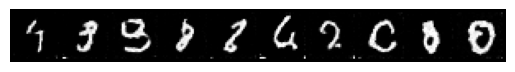

Epoch 21/100, Avg Loss: 0.0352


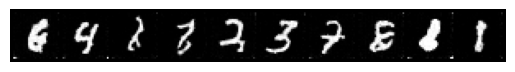

Epoch 22/100, Avg Loss: 0.0352


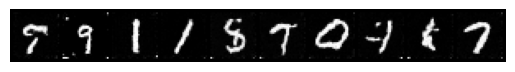

Epoch 23/100, Avg Loss: 0.0349


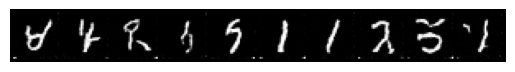

Epoch 24/100, Avg Loss: 0.0342


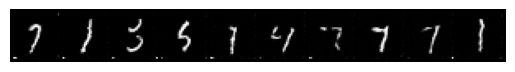

Epoch 25/100, Avg Loss: 0.0337


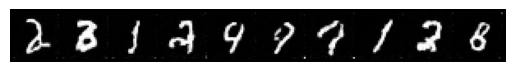

Epoch 26/100, Avg Loss: 0.0344


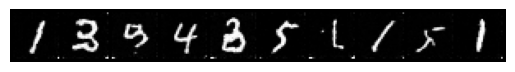

Epoch 27/100, Avg Loss: 0.0339


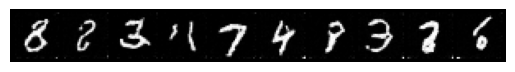

Epoch 28/100, Avg Loss: 0.0331


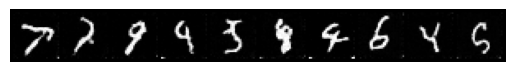

Epoch 29/100, Avg Loss: 0.0331


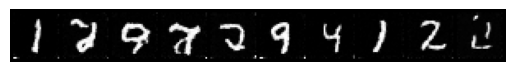

Epoch 30/100, Avg Loss: 0.0329


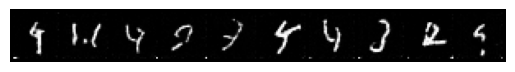

Epoch 31/100, Avg Loss: 0.0333


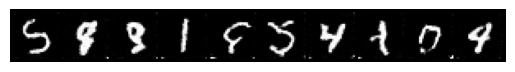

Epoch 32/100, Avg Loss: 0.0326


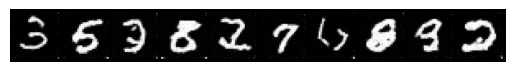

Epoch 33/100, Avg Loss: 0.0326


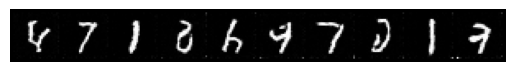

Epoch 34/100, Avg Loss: 0.0325


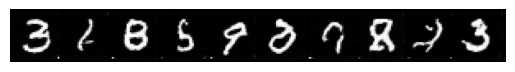

Epoch 35/100, Avg Loss: 0.0322


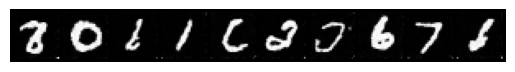

Epoch 36/100, Avg Loss: 0.0322


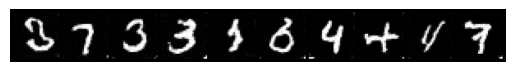

Epoch 37/100, Avg Loss: 0.0322


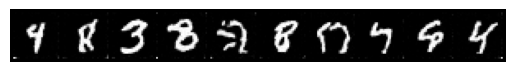

Epoch 38/100, Avg Loss: 0.0319


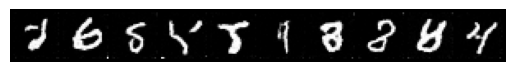

Epoch 39/100, Avg Loss: 0.0318


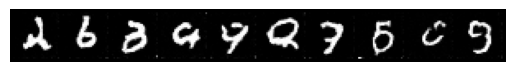

Epoch 40/100, Avg Loss: 0.0318


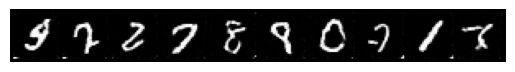

Epoch 41/100, Avg Loss: 0.0315


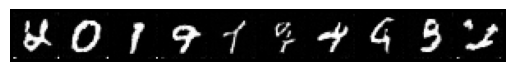

Epoch 42/100, Avg Loss: 0.0313


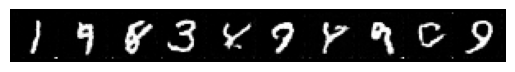

Epoch 43/100, Avg Loss: 0.0314


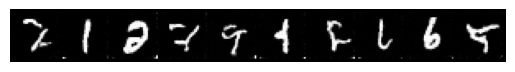

Epoch 44/100, Avg Loss: 0.0311


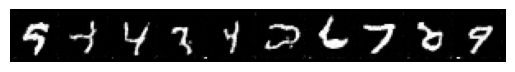

Epoch 45/100, Avg Loss: 0.0311


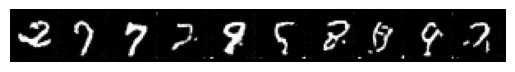

Epoch 46/100, Avg Loss: 0.0312


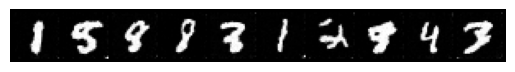

Epoch 47/100, Avg Loss: 0.0310


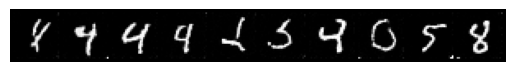

Epoch 48/100, Avg Loss: 0.0307


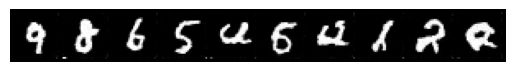

Epoch 49/100, Avg Loss: 0.0310


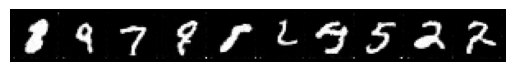

Epoch 50/100, Avg Loss: 0.0306


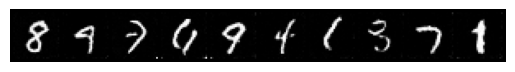

Epoch 51/100, Avg Loss: 0.0304


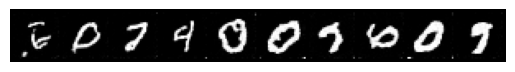

Epoch 52/100, Avg Loss: 0.0308


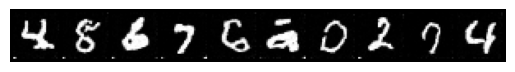

Epoch 53/100, Avg Loss: 0.0307


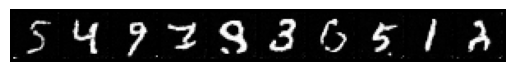

Epoch 54/100, Avg Loss: 0.0304


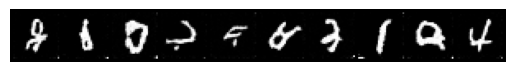

Epoch 55/100, Avg Loss: 0.0305


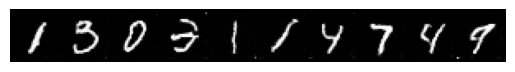

Epoch 56/100, Avg Loss: 0.0302


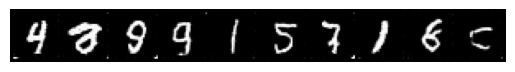

Epoch 57/100, Avg Loss: 0.0301


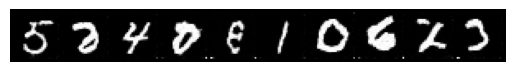

Epoch 58/100, Avg Loss: 0.0299


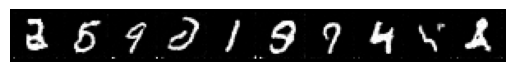

Epoch 59/100, Avg Loss: 0.0299


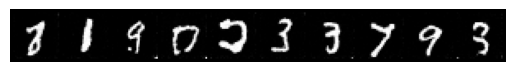

Epoch 60/100, Avg Loss: 0.0303


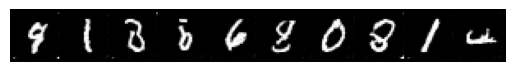

Epoch 61/100, Avg Loss: 0.0299


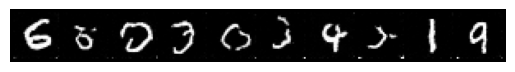

Epoch 62/100, Avg Loss: 0.0300


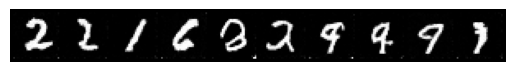

Epoch 63/100, Avg Loss: 0.0299


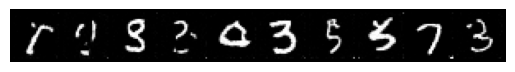

Epoch 64/100, Avg Loss: 0.0295


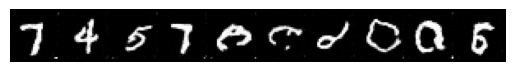

Epoch 65/100, Avg Loss: 0.0299


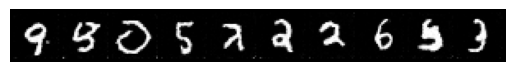

Epoch 66/100, Avg Loss: 0.0298


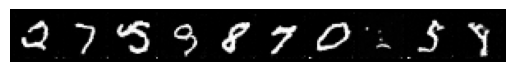

Epoch 67/100, Avg Loss: 0.0299


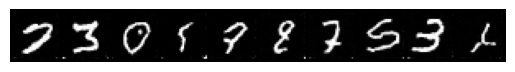

Epoch 68/100, Avg Loss: 0.0295


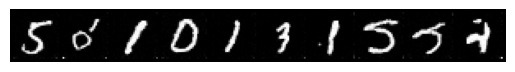

Epoch 69/100, Avg Loss: 0.0297


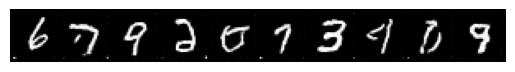

Epoch 70/100, Avg Loss: 0.0299


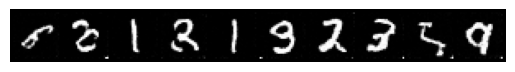

Epoch 71/100, Avg Loss: 0.0298


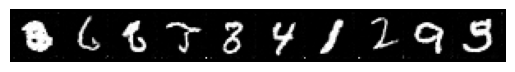

Epoch 72/100, Avg Loss: 0.0296


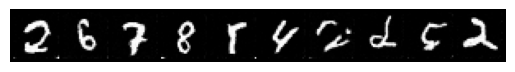

Epoch 73/100, Avg Loss: 0.0294


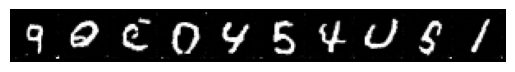

Epoch 74/100, Avg Loss: 0.0293


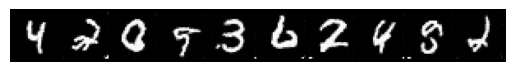

Epoch 75/100, Avg Loss: 0.0293


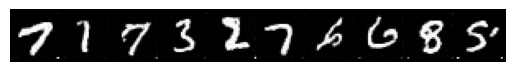

Epoch 76/100, Avg Loss: 0.0294


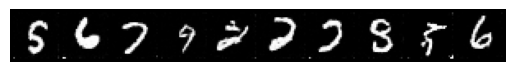

Epoch 77/100, Avg Loss: 0.0296


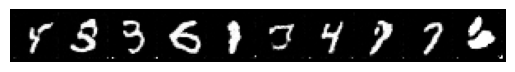

Epoch 78/100, Avg Loss: 0.0296


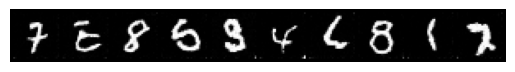

Epoch 79/100, Avg Loss: 0.0293


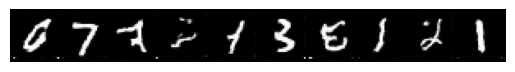

Epoch 80/100, Avg Loss: 0.0295


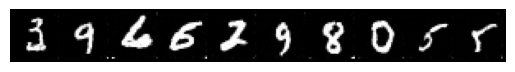

Epoch 81/100, Avg Loss: 0.0292


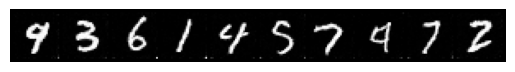

Epoch 82/100, Avg Loss: 0.0293


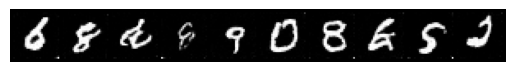

Epoch 83/100, Avg Loss: 0.0293


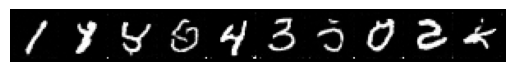

Epoch 84/100, Avg Loss: 0.0291


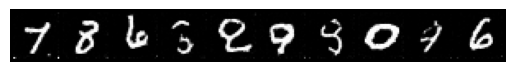

Epoch 85/100, Avg Loss: 0.0292


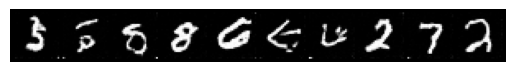

Epoch 86/100, Avg Loss: 0.0291


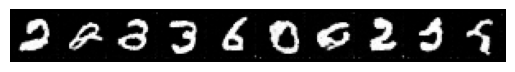

Epoch 87/100, Avg Loss: 0.0288


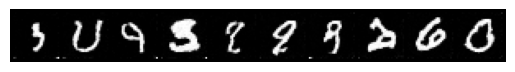

Epoch 88/100, Avg Loss: 0.0291


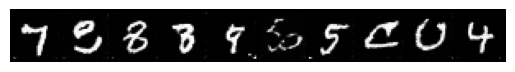

Epoch 89/100, Avg Loss: 0.0291


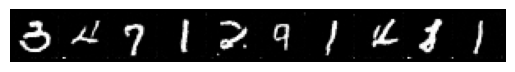

Epoch 90/100, Avg Loss: 0.0293


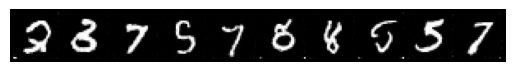

Epoch 91/100, Avg Loss: 0.0290


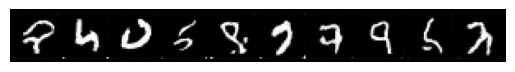

Epoch 92/100, Avg Loss: 0.0290


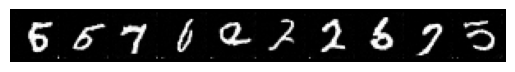

Epoch 93/100, Avg Loss: 0.0289


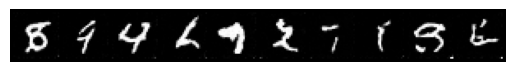

Epoch 94/100, Avg Loss: 0.0290


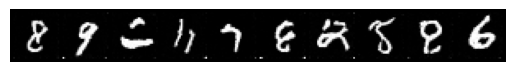

Epoch 95/100, Avg Loss: 0.0293


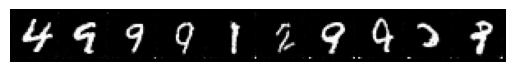

Epoch 96/100, Avg Loss: 0.0288


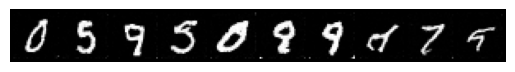

Epoch 97/100, Avg Loss: 0.0289


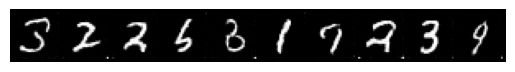

Epoch 98/100, Avg Loss: 0.0289


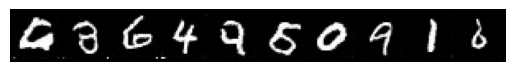

Epoch 99/100, Avg Loss: 0.0288


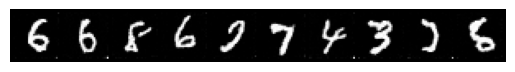

Epoch 100/100, Avg Loss: 0.0290


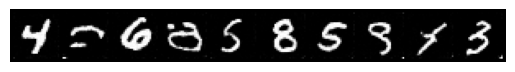

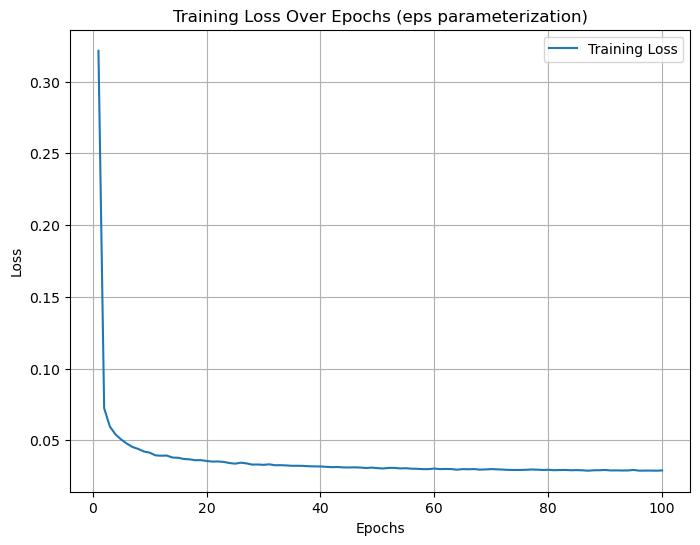


Training completed in 590.50 seconds.


In [8]:
import time

# Measure time around the training loop
start_time_eps = time.time()

# Call training loop for epsilon parameterization (default)
train(model_eps, optimizer_eps, scheduler_eps, dataloader_train,
      epochs=epochs, device=device, ema=True, per_epoch_callback=lambda model: reporter(model, target='eps'), target='eps')

end_time_eps = time.time()
print("")
print(f"Training completed in {end_time_eps - start_time_eps:.2f} seconds.")


### Target: Mu (mean of the reverse process)

Training:   0%|          | 0/23500 [00:00<?, ?it/s]

Epoch 1/100, Avg Loss: 0.0001


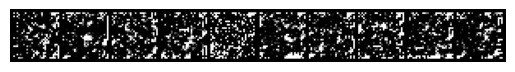

Epoch 2/100, Avg Loss: 0.0000


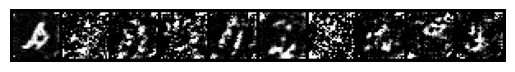

Epoch 3/100, Avg Loss: 0.0000


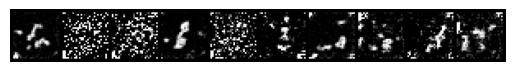

Epoch 4/100, Avg Loss: 0.0000


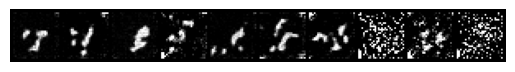

Epoch 5/100, Avg Loss: 0.0000


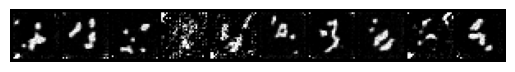

Epoch 6/100, Avg Loss: 0.0000


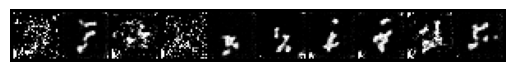

Epoch 7/100, Avg Loss: 0.0000


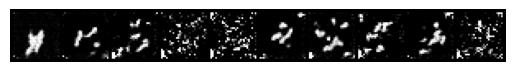

Epoch 8/100, Avg Loss: 0.0000


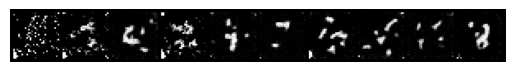

Epoch 9/100, Avg Loss: 0.0000


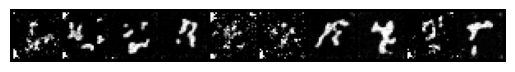

Epoch 10/100, Avg Loss: 0.0000


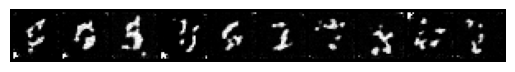

Epoch 11/100, Avg Loss: 0.0000


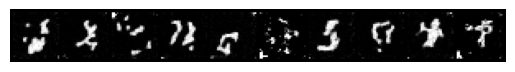

Epoch 12/100, Avg Loss: 0.0000


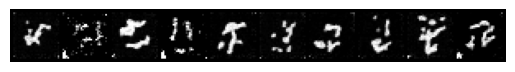

Epoch 13/100, Avg Loss: 0.0000


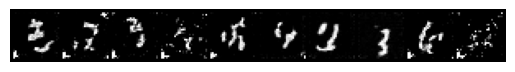

Epoch 14/100, Avg Loss: 0.0000


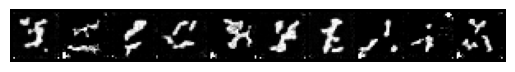

Epoch 15/100, Avg Loss: 0.0000


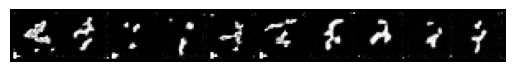

Epoch 16/100, Avg Loss: 0.0000


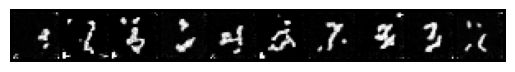

Epoch 17/100, Avg Loss: 0.0000


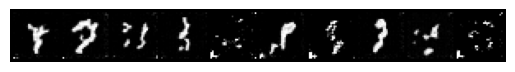

Epoch 18/100, Avg Loss: 0.0000


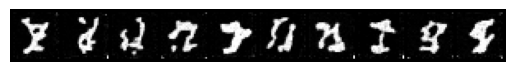

Epoch 19/100, Avg Loss: 0.0000


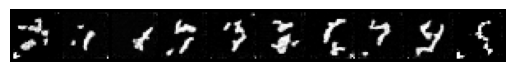

Epoch 20/100, Avg Loss: 0.0000


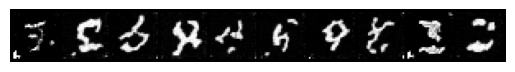

Epoch 21/100, Avg Loss: 0.0000


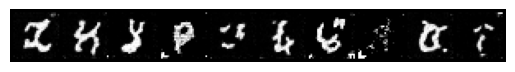

Epoch 22/100, Avg Loss: 0.0000


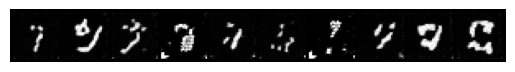

Epoch 23/100, Avg Loss: 0.0000


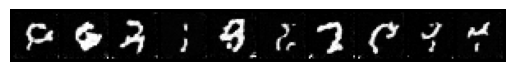

Epoch 24/100, Avg Loss: 0.0000


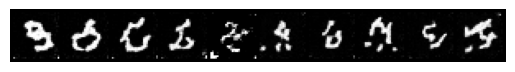

Epoch 25/100, Avg Loss: 0.0000


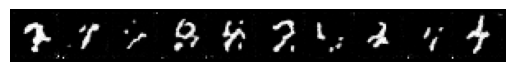

Epoch 26/100, Avg Loss: 0.0000


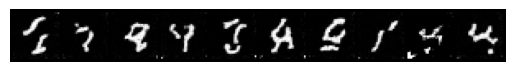

Epoch 27/100, Avg Loss: 0.0000


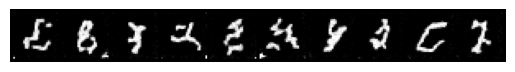

Epoch 28/100, Avg Loss: 0.0000


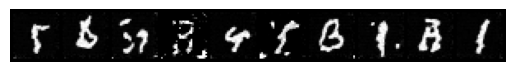

Epoch 29/100, Avg Loss: 0.0000


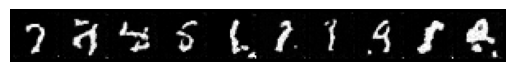

Epoch 30/100, Avg Loss: 0.0000


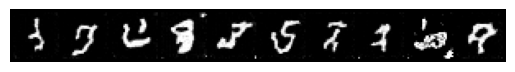

Epoch 31/100, Avg Loss: 0.0000


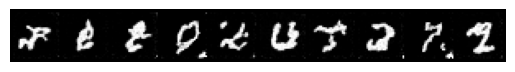

Epoch 32/100, Avg Loss: 0.0000


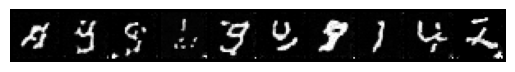

Epoch 33/100, Avg Loss: 0.0000


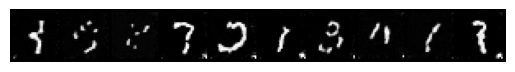

Epoch 34/100, Avg Loss: 0.0000


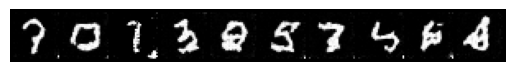

Epoch 35/100, Avg Loss: 0.0000


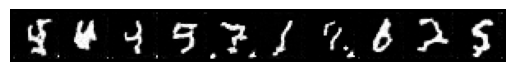

Epoch 36/100, Avg Loss: 0.0000


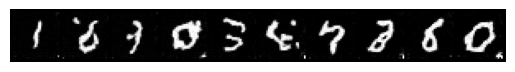

Epoch 37/100, Avg Loss: 0.0000


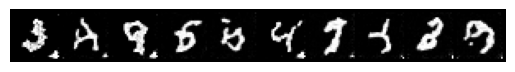

Epoch 38/100, Avg Loss: 0.0000


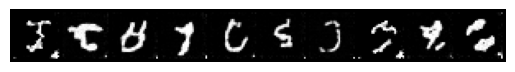

Epoch 39/100, Avg Loss: 0.0000


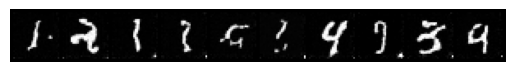

Epoch 40/100, Avg Loss: 0.0000


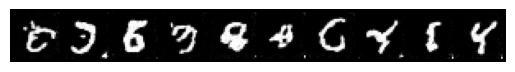

Epoch 41/100, Avg Loss: 0.0000


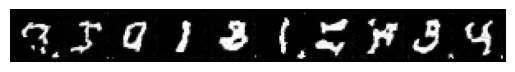

Epoch 42/100, Avg Loss: 0.0000


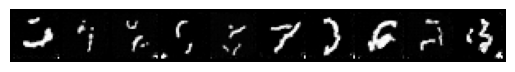

Epoch 43/100, Avg Loss: 0.0000


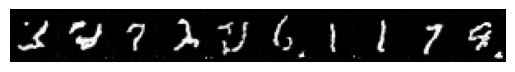

Epoch 44/100, Avg Loss: 0.0000


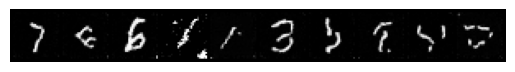

Epoch 45/100, Avg Loss: 0.0000


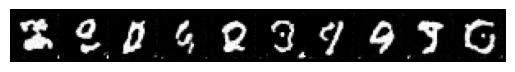

Epoch 46/100, Avg Loss: 0.0000


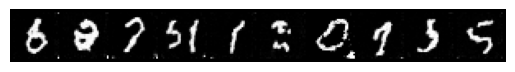

Epoch 47/100, Avg Loss: 0.0000


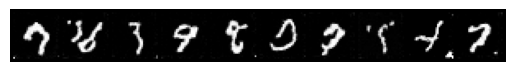

Epoch 48/100, Avg Loss: 0.0000


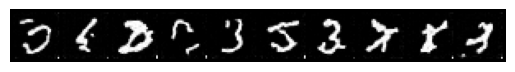

Epoch 49/100, Avg Loss: 0.0000


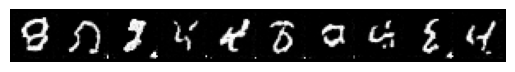

Epoch 50/100, Avg Loss: 0.0000


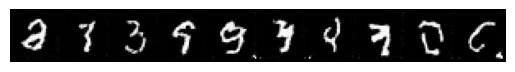

Epoch 51/100, Avg Loss: 0.0000


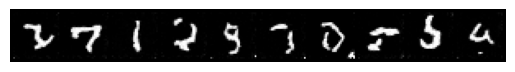

Epoch 52/100, Avg Loss: 0.0000


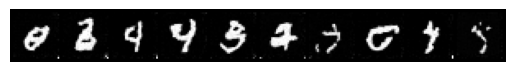

Epoch 53/100, Avg Loss: 0.0000


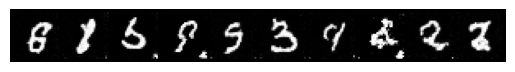

Epoch 54/100, Avg Loss: 0.0000


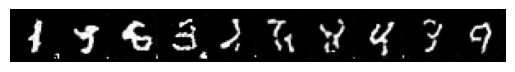

Epoch 55/100, Avg Loss: 0.0000


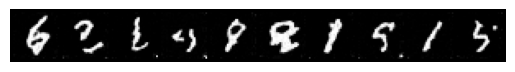

Epoch 56/100, Avg Loss: 0.0000


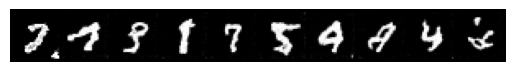

Epoch 57/100, Avg Loss: 0.0000


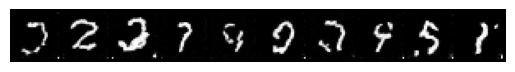

Epoch 58/100, Avg Loss: 0.0000


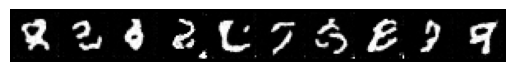

Epoch 59/100, Avg Loss: 0.0000


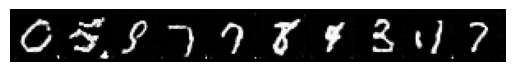

Epoch 60/100, Avg Loss: 0.0000


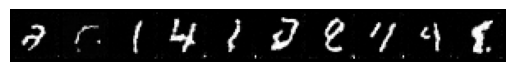

Epoch 61/100, Avg Loss: 0.0000


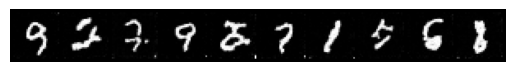

Epoch 62/100, Avg Loss: 0.0000


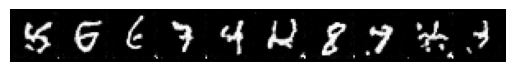

Epoch 63/100, Avg Loss: 0.0000


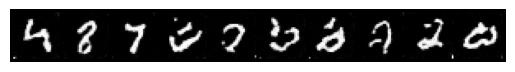

Epoch 64/100, Avg Loss: 0.0000


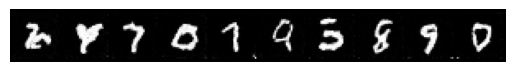

Epoch 65/100, Avg Loss: 0.0000


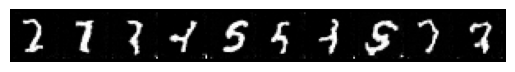

Epoch 66/100, Avg Loss: 0.0000


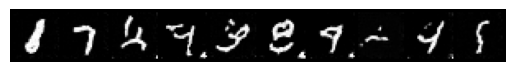

Epoch 67/100, Avg Loss: 0.0000


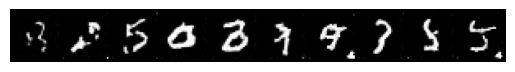

Epoch 68/100, Avg Loss: 0.0000


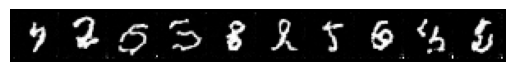

Epoch 69/100, Avg Loss: 0.0000


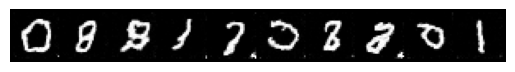

Epoch 70/100, Avg Loss: 0.0000


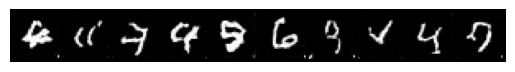

Epoch 71/100, Avg Loss: 0.0000


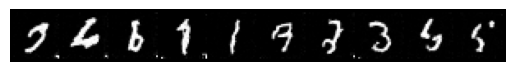

Epoch 72/100, Avg Loss: 0.0000


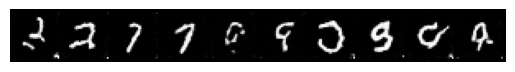

Epoch 73/100, Avg Loss: 0.0000


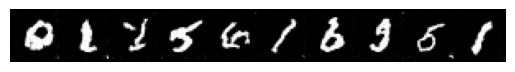

Epoch 74/100, Avg Loss: 0.0000


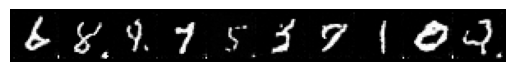

Epoch 75/100, Avg Loss: 0.0000


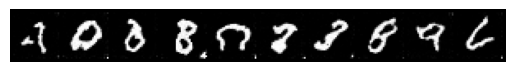

Epoch 76/100, Avg Loss: 0.0000


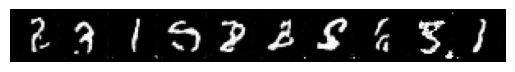

Epoch 77/100, Avg Loss: 0.0000


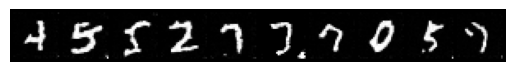

Epoch 78/100, Avg Loss: 0.0000


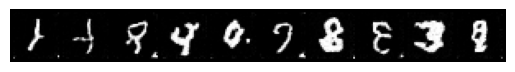

Epoch 79/100, Avg Loss: 0.0000


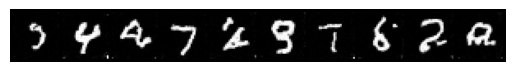

Epoch 80/100, Avg Loss: 0.0000


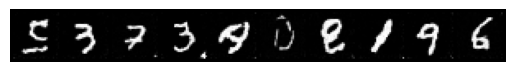

Epoch 81/100, Avg Loss: 0.0000


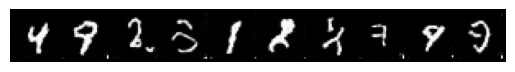

Epoch 82/100, Avg Loss: 0.0000


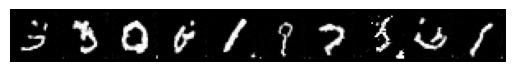

Epoch 83/100, Avg Loss: 0.0000


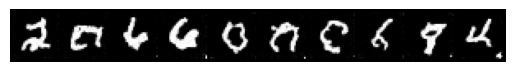

Epoch 84/100, Avg Loss: 0.0000


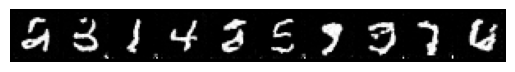

Epoch 85/100, Avg Loss: 0.0000


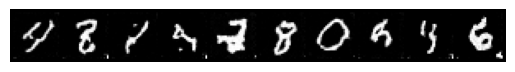

Epoch 86/100, Avg Loss: 0.0000


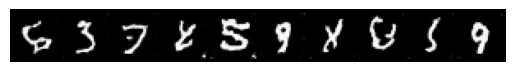

Epoch 87/100, Avg Loss: 0.0000


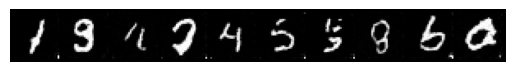

Epoch 88/100, Avg Loss: 0.0000


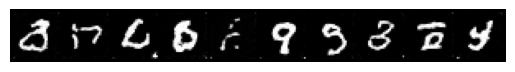

Epoch 89/100, Avg Loss: 0.0000


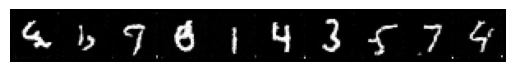

Epoch 90/100, Avg Loss: 0.0000


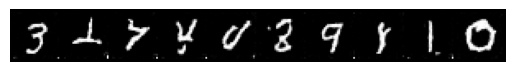

Epoch 91/100, Avg Loss: 0.0000


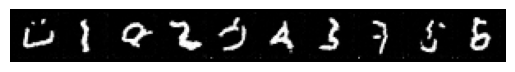

Epoch 92/100, Avg Loss: 0.0000


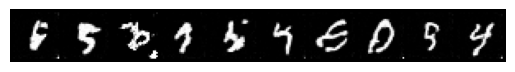

Epoch 93/100, Avg Loss: 0.0000


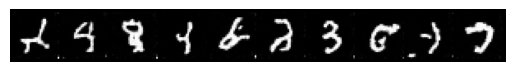

Epoch 94/100, Avg Loss: 0.0000


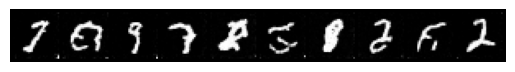

Epoch 95/100, Avg Loss: 0.0000


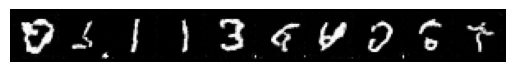

Epoch 96/100, Avg Loss: 0.0000


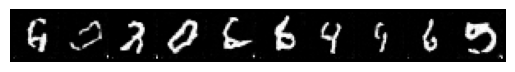

Epoch 97/100, Avg Loss: 0.0000


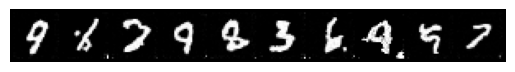

Epoch 98/100, Avg Loss: 0.0000


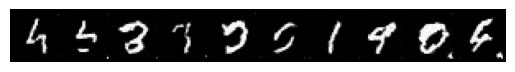

Epoch 99/100, Avg Loss: 0.0000


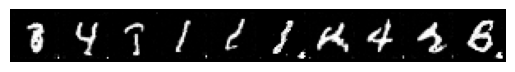

Epoch 100/100, Avg Loss: 0.0000


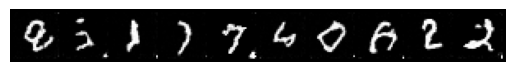

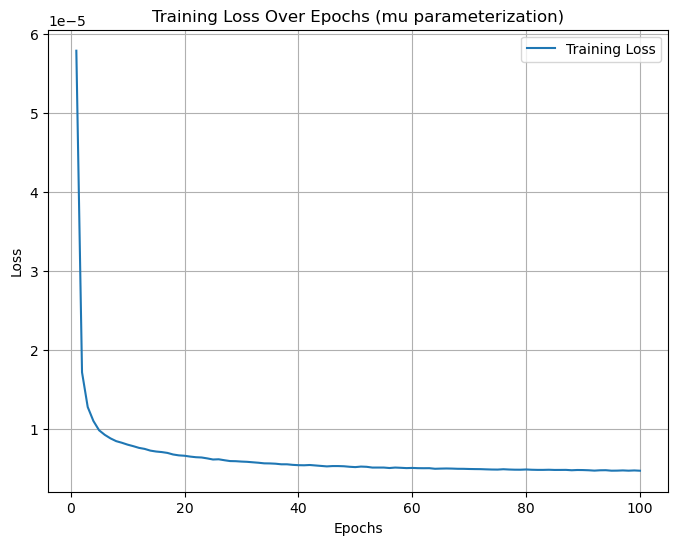


Training completed in 627.83 seconds.


In [9]:
# Measure time around the training loop
start_time_mu = time.time()

# Call training loop for mu parameterization
train(model_mu, optimizer_mu, scheduler_mu, dataloader_train,
      epochs=epochs, device=device, ema=True, per_epoch_callback=lambda model: reporter(model, target='mu'), target='mu')

end_time_mu = time.time()
print("")
print(f"Training completed in {end_time_mu - start_time_mu:.2f} seconds.")

### Target: x0 (original probability distribution)

Training:   0%|          | 0/23500 [00:00<?, ?it/s]

Epoch 1/100, Avg Loss: 204.5264


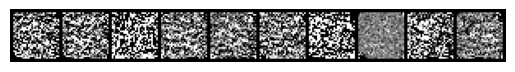

Epoch 2/100, Avg Loss: 22.5543


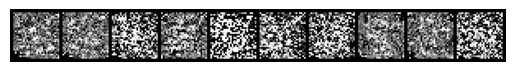

Epoch 3/100, Avg Loss: 16.8208


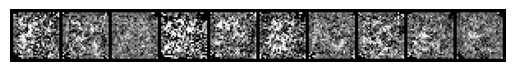

Epoch 4/100, Avg Loss: 14.4524


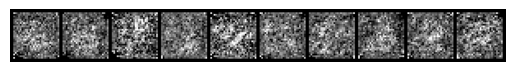

Epoch 5/100, Avg Loss: 12.9395


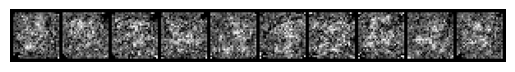

Epoch 6/100, Avg Loss: 11.6662


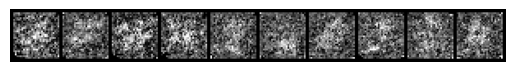

Epoch 7/100, Avg Loss: 10.6699


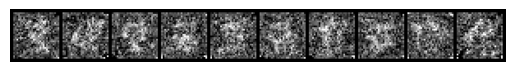

Epoch 8/100, Avg Loss: 9.0803


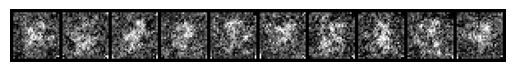

Epoch 9/100, Avg Loss: 8.7135


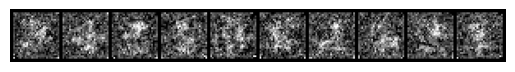

Epoch 10/100, Avg Loss: 7.9788


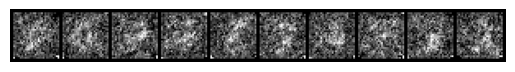

Epoch 11/100, Avg Loss: 7.6668


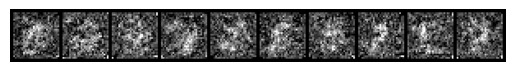

Epoch 12/100, Avg Loss: 7.3484


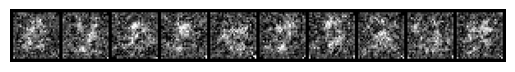

Epoch 13/100, Avg Loss: 6.5043


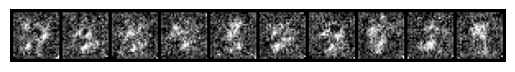

Epoch 14/100, Avg Loss: 6.4307


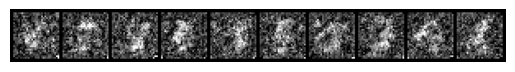

Epoch 15/100, Avg Loss: 6.3826


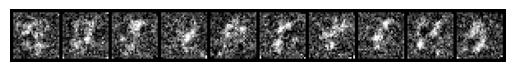

Epoch 16/100, Avg Loss: 5.5747


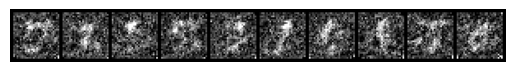

Epoch 17/100, Avg Loss: 5.6644


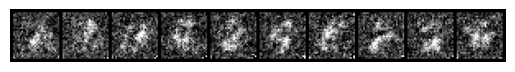

Epoch 18/100, Avg Loss: 6.0480


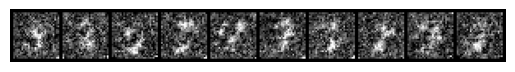

Epoch 19/100, Avg Loss: 5.8188


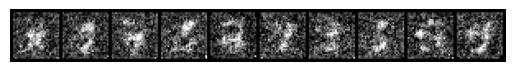

Epoch 20/100, Avg Loss: 5.4275


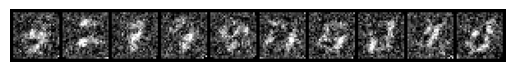

Epoch 21/100, Avg Loss: 5.3903


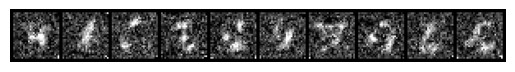

Epoch 22/100, Avg Loss: 5.3537


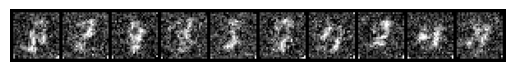

Epoch 23/100, Avg Loss: 5.0409


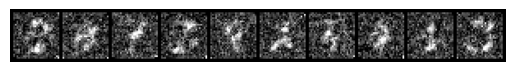

Epoch 24/100, Avg Loss: 4.8752


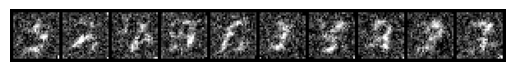

Epoch 25/100, Avg Loss: 4.7774


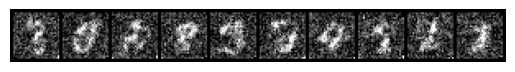

Epoch 26/100, Avg Loss: 4.5683


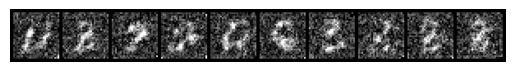

Epoch 27/100, Avg Loss: 4.4718


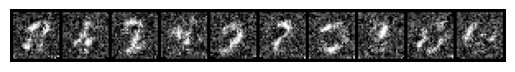

Epoch 28/100, Avg Loss: 4.7152


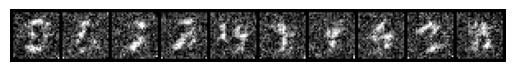

Epoch 29/100, Avg Loss: 4.4001


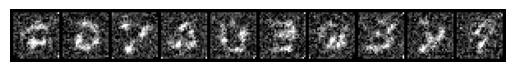

Epoch 30/100, Avg Loss: 4.3356


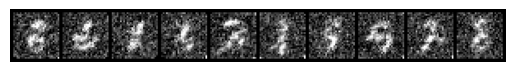

Epoch 31/100, Avg Loss: 4.2621


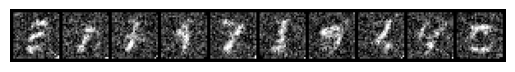

Epoch 32/100, Avg Loss: 4.4765


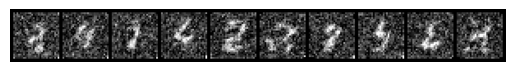

Epoch 33/100, Avg Loss: 4.0581


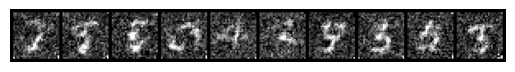

Epoch 34/100, Avg Loss: 4.1585


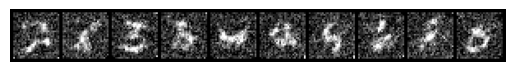

Epoch 35/100, Avg Loss: 4.1496


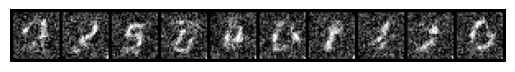

Epoch 36/100, Avg Loss: 4.0415


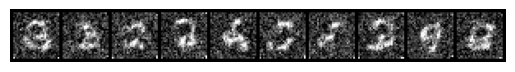

Epoch 37/100, Avg Loss: 3.8987


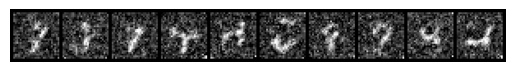

Epoch 38/100, Avg Loss: 3.9851


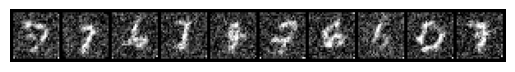

Epoch 39/100, Avg Loss: 3.9380


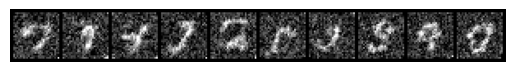

Epoch 40/100, Avg Loss: 3.8885


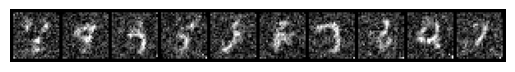

Epoch 41/100, Avg Loss: 3.7116


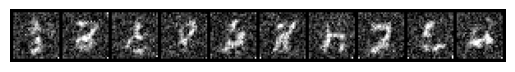

Epoch 42/100, Avg Loss: 3.7082


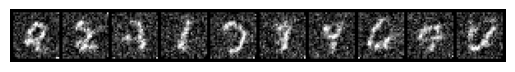

Epoch 43/100, Avg Loss: 3.6993


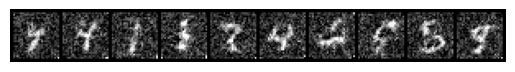

Epoch 44/100, Avg Loss: 3.7244


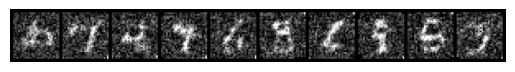

Epoch 45/100, Avg Loss: 3.5780


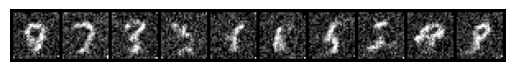

Epoch 46/100, Avg Loss: 3.6525


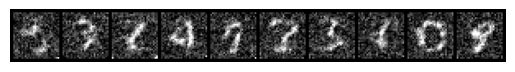

Epoch 47/100, Avg Loss: 3.6328


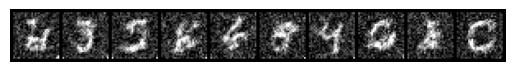

Epoch 48/100, Avg Loss: 3.6425


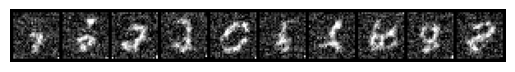

Epoch 49/100, Avg Loss: 3.5636


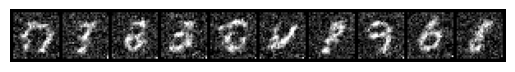

Epoch 50/100, Avg Loss: 3.5584


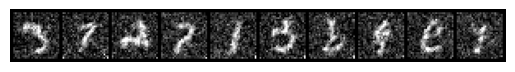

Epoch 51/100, Avg Loss: 3.6160


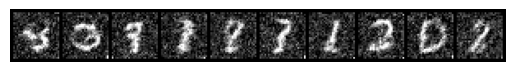

Epoch 52/100, Avg Loss: 3.5202


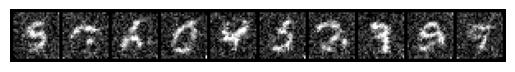

Epoch 53/100, Avg Loss: 3.4609


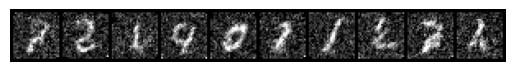

Epoch 54/100, Avg Loss: 3.4511


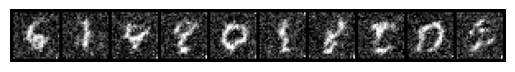

Epoch 55/100, Avg Loss: 3.4835


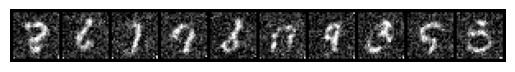

Epoch 56/100, Avg Loss: 3.4532


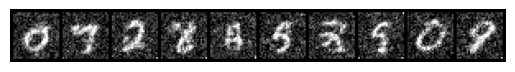

Epoch 57/100, Avg Loss: 3.4440


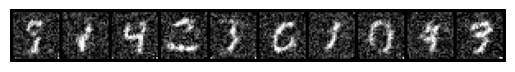

Epoch 58/100, Avg Loss: 3.4275


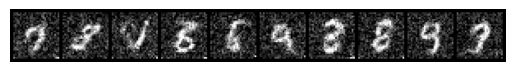

Epoch 59/100, Avg Loss: 3.4117


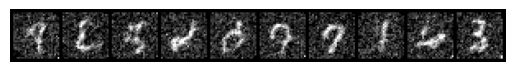

Epoch 60/100, Avg Loss: 3.2867


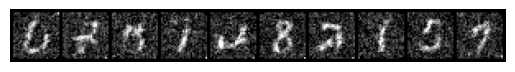

Epoch 61/100, Avg Loss: 3.4040


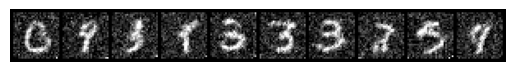

Epoch 62/100, Avg Loss: 3.4299


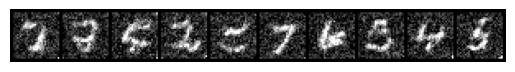

Epoch 63/100, Avg Loss: 3.4313


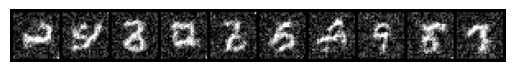

Epoch 64/100, Avg Loss: 3.3388


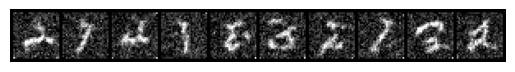

Epoch 65/100, Avg Loss: 3.3257


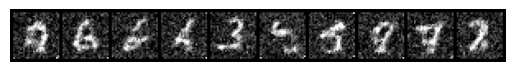

Epoch 66/100, Avg Loss: 3.3199


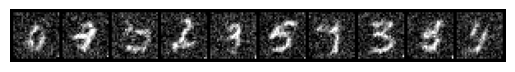

Epoch 67/100, Avg Loss: 3.2841


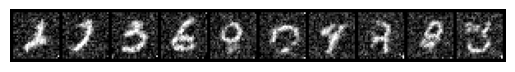

Epoch 68/100, Avg Loss: 3.3411


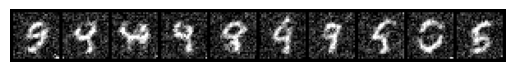

Epoch 69/100, Avg Loss: 3.3276


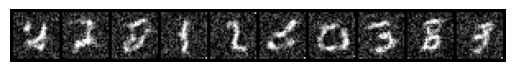

Epoch 70/100, Avg Loss: 3.2601


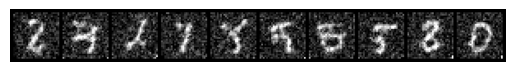

Epoch 71/100, Avg Loss: 3.2601


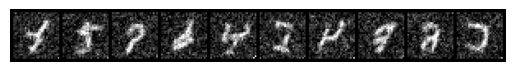

Epoch 72/100, Avg Loss: 3.2949


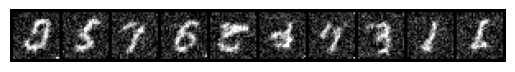

Epoch 73/100, Avg Loss: 3.2584


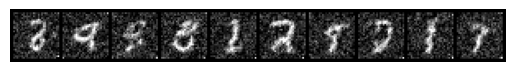

Epoch 74/100, Avg Loss: 3.1976


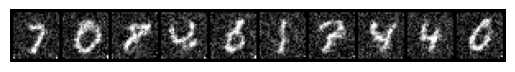

Epoch 75/100, Avg Loss: 3.2457


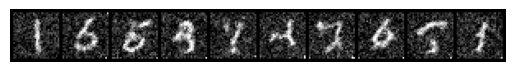

Epoch 76/100, Avg Loss: 3.2438


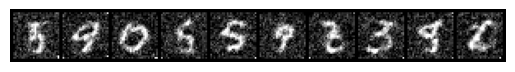

Epoch 77/100, Avg Loss: 3.1231


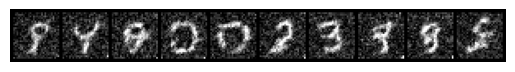

Epoch 78/100, Avg Loss: 3.1677


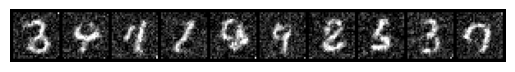

Epoch 79/100, Avg Loss: 3.1733


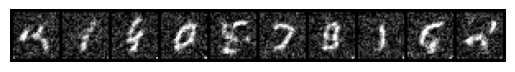

Epoch 80/100, Avg Loss: 3.2201


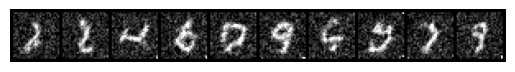

Epoch 81/100, Avg Loss: 3.1881


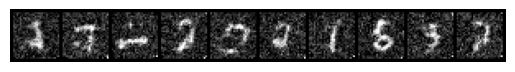

Epoch 82/100, Avg Loss: 3.1816


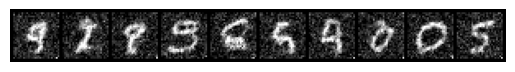

Epoch 83/100, Avg Loss: 3.1586


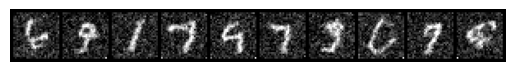

Epoch 84/100, Avg Loss: 3.1737


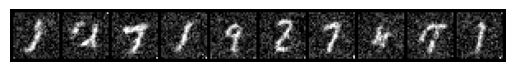

Epoch 85/100, Avg Loss: 3.1384


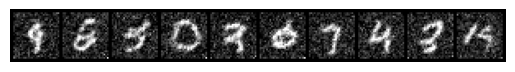

Epoch 86/100, Avg Loss: 3.1718


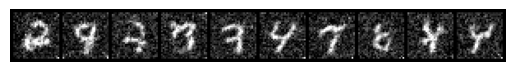

Epoch 87/100, Avg Loss: 3.1874


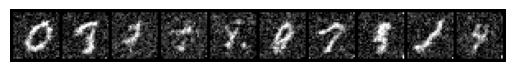

Epoch 88/100, Avg Loss: 3.1285


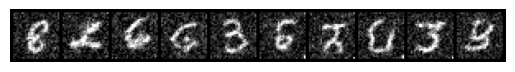

Epoch 89/100, Avg Loss: 3.1369


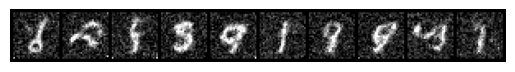

Epoch 90/100, Avg Loss: 3.0628


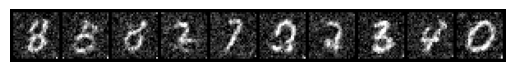

Epoch 91/100, Avg Loss: 3.1032


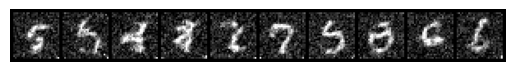

Epoch 92/100, Avg Loss: 3.0907


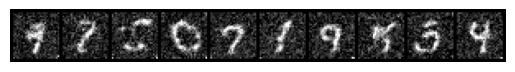

Epoch 93/100, Avg Loss: 3.1438


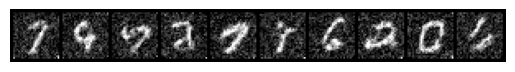

Epoch 94/100, Avg Loss: 3.1465


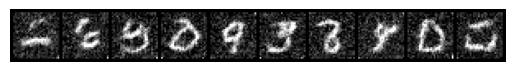

Epoch 95/100, Avg Loss: 3.1654


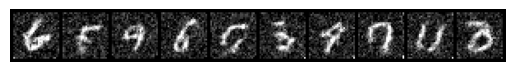

Epoch 96/100, Avg Loss: 3.1075


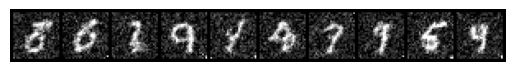

Epoch 97/100, Avg Loss: 3.1275


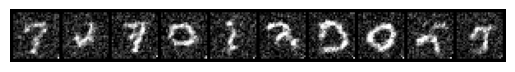

Epoch 98/100, Avg Loss: 3.1102


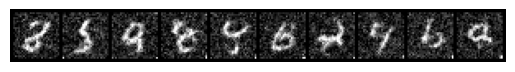

Epoch 99/100, Avg Loss: 3.1105


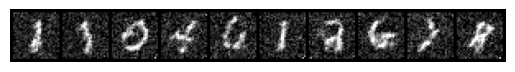

Epoch 100/100, Avg Loss: 3.1034


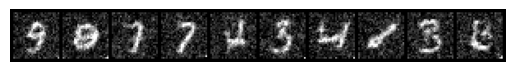

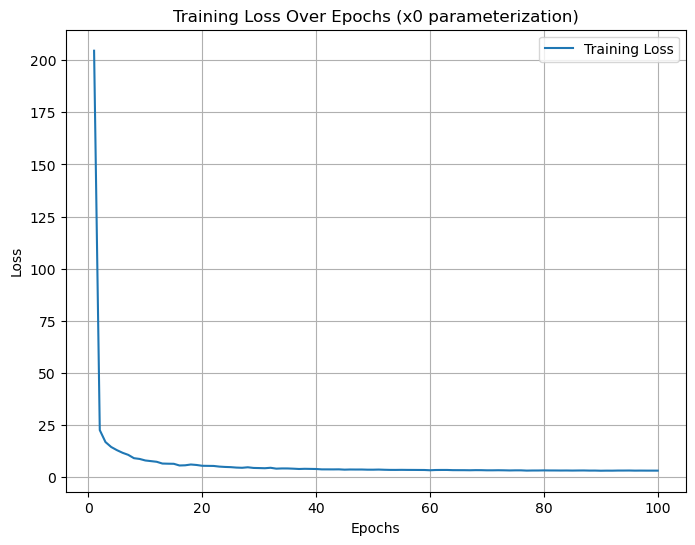


Training completed in 604.55 seconds.


In [10]:
# Measure time around the training loop
start_time_x0 = time.time()

# Call training loop for x0 parameterization
train(model_x0, optimizer_x0, scheduler_x0, dataloader_train,
      epochs=epochs, device=device, ema=True, per_epoch_callback=lambda model: reporter(model, target='x0'), target='x0')

end_time_x0 = time.time()
print("")
print(f"Training completed in {end_time_x0 - start_time_x0:.2f} seconds.")

## Quantitative Comparisons: Frechet Inception Distance (FID) and Inception Score (IS)

### Inception Score

In [11]:
import torch
import torch.nn.functional as F
from torchvision.models import inception_v3
from torchvision import datasets, transforms
import scipy
from scipy.linalg import sqrtm
import numpy as np

# Load pre-trained InceptionV3
inception = inception_v3(pretrained=True, transform_input=False).eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
inception = inception.to(device)

# FID Calculation
def calculate_fid(real_features, generated_features):
    """
    Compute Frechet Inception Distance (FID) between real and generated features.

    Parameters
    ----------
    real_features : np.ndarray
        Features from the real images, shape (N, D).
    generated_features : np.ndarray
        Features from the generated images, shape (N, D).

    Returns
    -------
    float
        FID score.
    """
    # Mean and covariance of real (r) and generated features (g)
    mu_r, sigma_r = real_features.mean(axis=0), np.cov(real_features, rowvar=False)
    mu_g, sigma_g = generated_features.mean(axis=0), np.cov(generated_features, rowvar=False)

    # Compute squared difference of means
    diff = mu_r - mu_g
    mean_norm = np.sum(diff**2)

    # Compute sqrt of product of covariance matrices
    cov_mean = sqrtm(sigma_r @ sigma_g)
    if np.iscomplexobj(cov_mean):
        cov_mean = cov_mean.real  # Handle numerical instability

    # Compute FID
    fid = mean_norm + np.trace(sigma_r + sigma_g - 2 * cov_mean)
    return fid

# IS Calculation
def calculate_inception_score(generated_images, inception, splits=10):
    """
    Compute Inception Score (IS) for a set of generated images.

    Parameters
    ----------
    generated_images : torch.Tensor
        Generated images, shape (N, C, H, W).
    inception : nn.Module
        Pre-trained Inception model.
    splits : int, optional
        Number of splits for IS computation.

    Returns
    -------
    float
        Inception Score.
    """
    with torch.no_grad():
        # Resize images to 299x299 for pre-trained InceptionV3
        generated_images = F.interpolate(generated_images, size=(299, 299), mode='bilinear')
        logits = inception(generated_images)  # Pass through InceptionV3
        probabilities = F.softmax(logits, dim=1).cpu().numpy()

    # Split the probabilities into groups for KL divergence calculation
    scores = []
    for i in range(splits):
        part = probabilities[i * (len(probabilities) // splits):(i + 1) * (len(probabilities) // splits), :]
        p_y = np.mean(part, axis=0)  # Marginal distribution
        kl_div = part * (np.log(part) - np.log(p_y))  # KL divergence
        scores.append(np.exp(np.mean(np.sum(kl_div, axis=1))))

    return np.mean(scores)  # Mean score over splits

# Feature Extraction
def extract_features(images, inception, batch_size=64):
    """
    Extract features from Inception's pool3 layer for a batch of images.

    Parameters
    ----------
    images : torch.Tensor
        Images to extract features from, shape (N, C, H, W).
    inception : nn.Module
        Pre-trained Inception model.
    batch_size : int
        Batch size for feature extraction.

    Returns
    -------
    np.ndarray
        Extracted features, shape (N, D).
    """
    features = []
    with torch.no_grad():
        for i in range(0, len(images), batch_size):
            batch = images[i:i + batch_size].to(device)
            batch = F.interpolate(batch, size=(299, 299), mode='bilinear')  # Resize for InceptionV3
            batch_features = inception(batch).cpu().numpy()
            features.append(batch_features)
    return np.concatenate(features, axis=0)

/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /home/ucloud/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth

%|          | 0.00/104M [00:00<?, ?B/s]
%|          | 256k/104M [00:00<00:46, 2.34MB/s]
%|▏         | 1.75M/104M [00:00<00:11, 9.68MB/s]
%|▋         | 6.88M/104M [00:00<00:03, 28.4MB/s]
%|█▎        | 13.2M/

In [12]:
# Collect real images from the dataloader
real_images = []
num_samples = 1000  # Number of real images to match generated samples
for x, _ in dataloader_train:
    real_images.append(x)
    if len(torch.cat(real_images)) >= num_samples:
        break

real_images = torch.cat(real_images)[:num_samples]
real_images = real_images.view(-1, 1, 28, 28)
real_images = real_images.repeat(1, 3, 1, 1)  # Convert to 3 channels for InceptionV3

def sample_generated_images(model, num_samples=1000):
    generated_images = (model.sample((num_samples, 28 * 28)).reshape(-1, 1, 28, 28)).repeat(1, 3, 1, 1) # Convert to 3 channels for InceptionV3
    return generated_images

def agg_metrics(model, real_images, metric, num_runs=5, batch_size=64, splits=10):
    """
    Evaluate FID or IS multiple times and return the average and standard deviation.

    Parameters
    ----------
    real_images : torch.Tensor
        Real images to calculate FID, shape (N, C, H, W).
    generated_images: callable
        A function that generates a batch of images, shape (N, C, H, W).
    metric : str
        Metric to calculate ("FID" or "IS").
    num_runs : int, optional
        Number of runs for averaging metrics, default is 5.
    batch_size : int, optional
        Batch size for feature extraction and generation.
    splits : int, optional
        Number of splits for IS computation (used only for IS).

    Returns
    -------
    dict
        Dictionary containing the average and standard deviation of the chosen metric.
    """
    scores = []
    real_features = extract_features(real_images, inception)

    for run in range(num_runs):
        # Generate images for the current run
        generated_images = sample_generated_images(model)

        # Ensure generated images are on the correct device
        generated_images = generated_images.to(device)

        if metric == "FID":
            # Extract features for generated images
            generated_features = extract_features(generated_images, inception)
            # Calculate FID
            score = calculate_fid(real_features, generated_features)

        elif metric == "IS":
            # Calculate IS directly from generated images
            score = calculate_inception_score(generated_images, inception)

        else:
            raise ValueError("Invalid metric. Choose either 'FID' or 'IS'.")

        scores.append(score)

    # Calculate average and standard deviation
    avg_score = np.mean(scores)
    std_score = np.std(scores)

    return {"mean": avg_score, "std": std_score}

# Target = eps
fid_results_eps = agg_metrics(model_eps, real_images, metric = "FID")
is_results_eps = agg_metrics(model_eps, real_images, metric = "IS")

print("Noise Level (epsilon) Parameterization:")
print("")
print(f"FID Score: {fid_results_eps['mean']:.2f} ± {fid_results_eps['std']:.2f}")
print(f"Inception Score: {is_results_eps['mean']:.2f} ± {is_results_eps['std']:.2f}")
print("")
print("")

# Target = mu
fid_results_mu = agg_metrics(model_mu, real_images, metric = "FID")
is_results_mu = agg_metrics(model_mu, real_images, metric = "IS")

print("Mean (mu) Parameterization:")
print("")
print(f"FID Score: {fid_results_mu['mean']:.2f} ± {fid_results_mu['std']:.2f}")
print(f"Inception Score: {is_results_mu['mean']:.2f} ± {is_results_mu['std']:.2f}")
print("")
print("")

# Target = x0
fid_results_x0 = agg_metrics(model_x0, real_images, metric = "FID")
is_results_x0 = agg_metrics(model_x0, real_images, metric = "IS")

print("Original Distribution (x0) Parameterization:")
print("")
print(f"FID Score: {fid_results_x0['mean']:.2f} ± {fid_results_x0['std']:.2f}")
print(f"Inception Score: {is_results_x0['mean']:.2f} ± {is_results_x0['std']:.2f}")

Noise Level (epsilon) Parameterization:

FID Score: 330.01 ± 4.17
Inception Score: 2.18 ± 0.03


Mean (mu) Parameterization:

FID Score: 383.10 ± 4.31
Inception Score: 2.12 ± 0.05


Original Distribution (x0) Parameterization:

FID Score: 1408.18 ± 10.27
Inception Score: 1.87 ± 0.04


### FID

In [18]:
import inspect
from typing import Dict, List, Optional, Tuple
from torchvision.models import inception_v3
from scipy import linalg

class InceptionStatistics:
    """Compute inception statistics for FID and IS scores"""
    def __init__(self, device):
        self.device = device
        self.inception = inception_v3(pretrained=True, transform_input=False).to(device)
        self.inception.eval()
        
        # Create a hook to capture features
        self.features = None
        def hook(module, input, output):
            self.features = output.detach()
        
        # Register the hook on the avgpool layer
        self.inception.avgpool.register_forward_hook(hook)
    
    def get_inception_features(self, images: torch.Tensor, batch_size: int = 50) -> Tuple[np.ndarray, np.ndarray]:
        """Extract both features and logits in a single pass"""
        n_samples = images.shape[0]
        features_list = []
        logits_list = []
        
        for i in range(0, n_samples, batch_size):
            batch = images[i:i+batch_size]
            if batch.dim() == 2:
                batch = batch.reshape(-1, 1, 28, 28)
            if batch.shape[1] == 1:
                batch = batch.repeat(1, 3, 1, 1)
                
            # Resize to inception input size
            batch = F.interpolate(batch, size=(299, 299), mode='bilinear', align_corners=False)
            
            with torch.no_grad():
                logits = self.inception(batch)
                features = self.features.squeeze()
                
            features_list.append(features.cpu().numpy())
            logits_list.append(logits.cpu().numpy())
            
        return np.concatenate(features_list), np.concatenate(logits_list)

    def compute_statistics(self, features: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        """Compute mean and covariance for FID"""
        mu = np.mean(features, axis=0)
        sigma = np.cov(features, rowvar=False)
        return mu, sigma
    
    def compute_fid(self, real_features: np.ndarray, fake_features: np.ndarray) -> float:
        """Compute Fréchet Inception Distance"""
        mu1, sigma1 = self.compute_statistics(real_features)
        mu2, sigma2 = self.compute_statistics(fake_features)
        
        diff = mu1 - mu2
        covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
        if np.iscomplexobj(covmean):
            covmean = covmean.real
        fid = diff.dot(diff) + np.trace(sigma1 + sigma2 - 2*covmean)
        return float(fid)
    
    def compute_inception_score(self, logits: np.ndarray, splits: int = 10) -> Tuple[float, float]:
        """Compute Inception Score from logits"""
        probs = F.softmax(torch.from_numpy(logits), dim=1).numpy()
        
        scores = []
        split_size = probs.shape[0] // splits
        for i in range(splits):
            part = probs[i * split_size:(i + 1) * split_size]
            kl = part * (np.log(part) - np.log(np.expand_dims(np.mean(part, 0), 0)))
            kl = np.mean(np.sum(kl, 1))
            scores.append(np.exp(kl))
            
        return np.mean(scores), np.std(scores)

def evaluate_model_multiple_runs(
    model: nn.Module,
    dataloader: torch.utils.data.DataLoader,
    evaluator: 'InceptionStatistics',
    n_runs: int = 5,
    n_samples: int = 1000,
    batch_size: int = 50,
    device: str = 'cuda'
) -> Dict[str, Dict[str, float]]:
    """
    Evaluate diffusion model multiple times and compute statistics
    
    Args:
        model: The model to evaluate
        dataloader: DataLoader containing real images
        evaluator: InceptionStatistics instance
        n_runs: Number of evaluation runs
        n_samples: Number of samples per run
        batch_size: Batch size for generation
        device: Device to use
        
    Returns:
        Dictionary containing mean and std of metrics
    """
    # Storage for multiple runs
    fid_scores = []
    is_means = []
    is_stds = []
    
    # Check if model accepts labels
    sample_params = inspect.signature(model.sample).parameters
    accepts_labels = 'labels' in sample_params or 'y' in sample_params
    
    # Get real images once
    real_images = []
    for images, _ in dataloader:
        if images.dim() == 2:
            images = images.reshape(-1, 1, 28, 28)
        real_images.append(images)
        if len(real_images) * images.shape[0] >= n_samples:
            break
    real_images = torch.cat(real_images, dim=0)[:n_samples]
    
    # Compute real features once
    print("Computing inception features for real images...")
    real_features, _ = evaluator.get_inception_features(real_images.to(device))
    
    # Multiple evaluation runs
    for run in tqdm(range(n_runs), desc="Evaluation runs"):
        try:
            # Generate fake images
            model.eval()
            fake_images = []
            with torch.no_grad():
                for i in range(0, n_samples, batch_size):
                    curr_batch_size = min(batch_size, n_samples - i)
                    if accepts_labels:
                        labels = torch.randint(0, 10, (curr_batch_size,)).to(device)
                        try:
                            samples = model.sample((curr_batch_size, 28*28), labels=labels)
                        except TypeError:
                            samples = model.sample((curr_batch_size, 28*28), y=labels)
                    else:
                        samples = model.sample((curr_batch_size, 28*28))
                    
                    samples = (samples + 1) / 2  # Map from [-1,1] to [0,1]
                    samples = samples.clamp(0, 1)
                    samples = samples.reshape(-1, 1, 28, 28)
                    fake_images.append(samples.cpu())
            
            fake_images = torch.cat(fake_images, dim=0)[:n_samples]
            
            # Compute inception features for generated images
            print(f"Computing inception features for generated images (run {run+1}/{n_runs})...")
            fake_features, fake_logits = evaluator.get_inception_features(fake_images.to(device))
            
            # Compute metrics
            fid = evaluator.compute_fid(real_features, fake_features)
            is_mean, is_std = evaluator.compute_inception_score(fake_logits)
            
            # Store results
            fid_scores.append(fid)
            is_means.append(is_mean)
            is_stds.append(is_std)
            
        except Exception as e:
            print(f"Error in evaluation run {run+1}: {str(e)}")
            continue
    
    # Compute statistics across runs
    results = {
        'FID': {
            'mean': float(np.mean(fid_scores)),
            'std': float(np.std(fid_scores))
        },
        'IS': {
            'mean': float(np.mean(is_means)),
            'std': float(np.std(is_means))
        }
    }
    
    return results

def compare_models_multiple_runs(
    model_eps: nn.Module,
    model_mu: nn.Module,
    model_x0: nn.Module,
    dataloader: torch.utils.data.DataLoader,
    device: str,
    evaluator: 'InceptionStatistics' = None,
    n_runs: int = 5,
    n_samples: int = 1000,
    batch_size: int = 50
) -> Dict[str, Dict[str, Dict[str, float]]]:
    """
    Compare multiple diffusion models by running evaluation multiple times
    
    Args:
        model_eps: Base DDPM model
        model_mu: Target parameterization = mu
        model_x0: Target parameterization = mu
        dataloader: DataLoader containing real images
        device: Device to use
        evaluator: InceptionStatistics instance
        n_runs: Number of evaluation runs
        n_samples: Number of samples per run
        batch_size: Batch size for generation
    
    Returns:
        Dictionary containing evaluation results for each model
    """
    if evaluator is None:
        evaluator = InceptionStatistics(device)
    
    # Evaluate each model
    print("\nEvaluating base model...")
    eps_results = evaluate_model_multiple_runs(
        model_eps, dataloader, evaluator, 
        n_runs=n_runs, n_samples=n_samples, 
        batch_size=batch_size, device=device
    )
    
    print("\nEvaluating target parameterization = mu model...")
    mu_results = evaluate_model_multiple_runs(
        model_mu, dataloader, evaluator,
        n_runs=n_runs, n_samples=n_samples,
        batch_size=batch_size, device=device
    )
    
    print("\nEvaluating target parameterization = x0 model...")
    x0_results = evaluate_model_multiple_runs(
        model_x0, dataloader, evaluator,
        n_runs=n_runs, n_samples=n_samples,
        batch_size=batch_size, device=device
    )
    
    return {
        'eps': eps_results,
        'mu': mu_results,
        'x0': x0_results
    }


Running quantitative comparison...

Evaluating base model...


/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Computing inception features for real images...


Evaluation runs:   0%|          | 0/5 [00:00<?, ?it/s]

Computing inception features for generated images (run 1/5)...
Computing inception features for generated images (run 2/5)...
Computing inception features for generated images (run 3/5)...
Computing inception features for generated images (run 4/5)...
Computing inception features for generated images (run 5/5)...

Evaluating target parameterization = mu model...
Computing inception features for real images...


Evaluation runs:   0%|          | 0/5 [00:00<?, ?it/s]

Computing inception features for generated images (run 1/5)...
Computing inception features for generated images (run 2/5)...
Computing inception features for generated images (run 3/5)...
Computing inception features for generated images (run 4/5)...
Computing inception features for generated images (run 5/5)...

Evaluating target parameterization = x0 model...
Computing inception features for real images...


Evaluation runs:   0%|          | 0/5 [00:00<?, ?it/s]

Computing inception features for generated images (run 1/5)...
Computing inception features for generated images (run 2/5)...
Computing inception features for generated images (run 3/5)...
Computing inception features for generated images (run 4/5)...
Computing inception features for generated images (run 5/5)...

Generating visualizations...
Generating Base Model samples...
Generating target parameterization = mu model samples...
Generating target parameterization = x0 model samples...


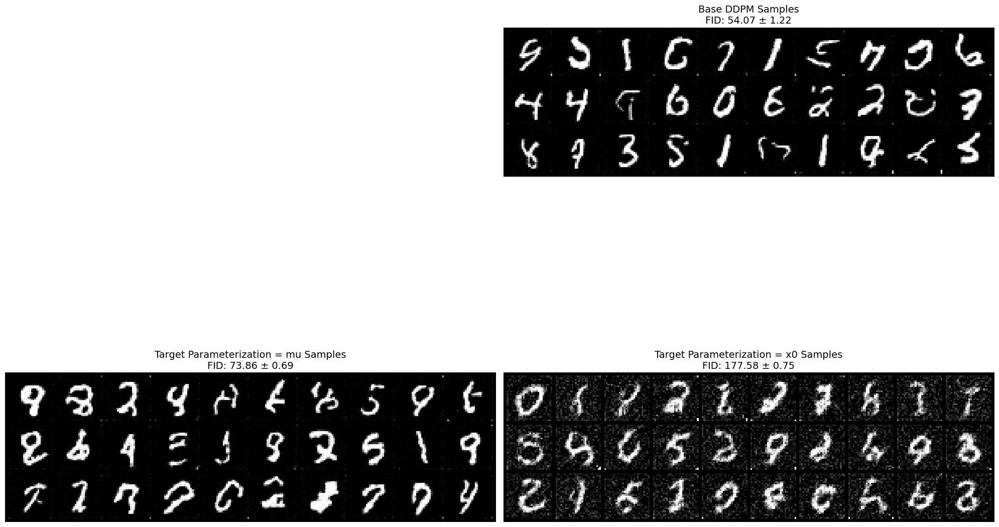

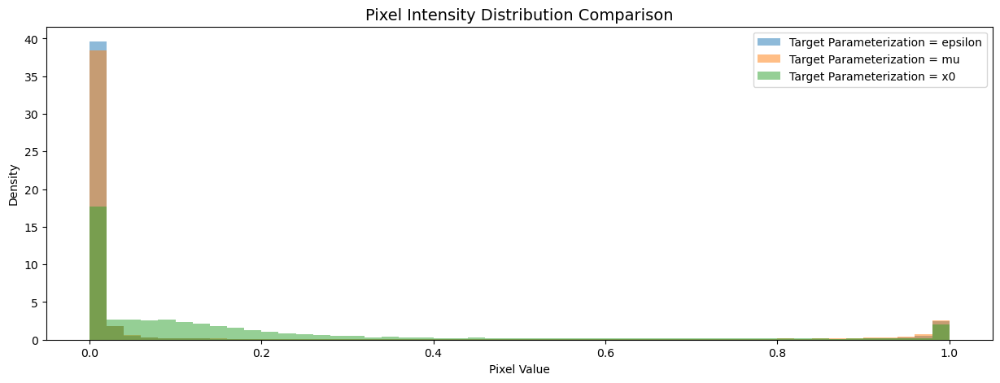

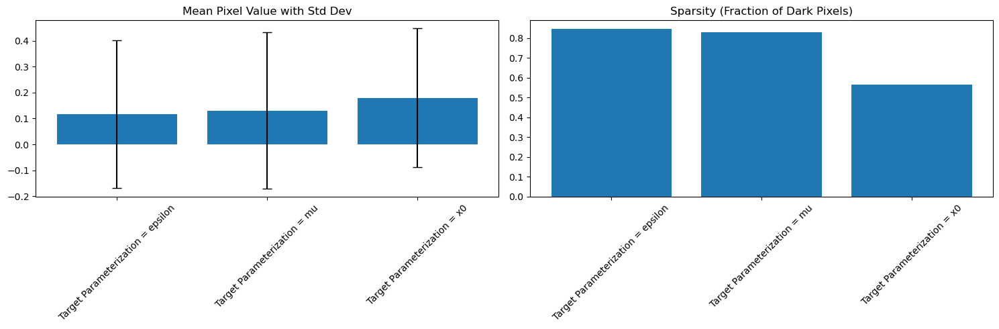

In [19]:
def compare_models_with_viz(model_eps, model_mu, model_x0, dataloader, device, n_runs=5):
    # First show the numerical metrics with multiple runs
    print("\nRunning quantitative comparison...")
    results = compare_models_multiple_runs(
        model_eps, model_mu, model_x0, 
        dataloader, device, n_runs=n_runs
    )
    
    # Then show the visualizations with the results
    print("\nGenerating visualizations...")
    visualize_model_comparison(model_eps, model_mu, model_x0, dataloader, device, results)
    
    return results

def visualize_model_comparison(model_eps, model_mu, model_x0, dataloader, device, results, n_samples=30):
    """Generate visual comparisons between different diffusion models"""
    
    def get_samples(model, with_labels=False):
        """Generate samples from a model, handling both conditional and unconditional cases"""
        model.eval()
        with torch.no_grad():
            # Check if model's sample function accepts labels parameter
            sample_params = inspect.signature(model.sample).parameters
            accepts_labels = 'labels' in sample_params or 'y' in sample_params
            
            if with_labels and accepts_labels:
                # Generate 3 samples for each digit
                samples = []
                for digit in range(10):
                    labels = torch.full((3,), digit, device=device)
                    # Try both 'labels' and 'y' as parameter names
                    try:
                        sample = model.sample((3, 28*28), labels=labels)
                    except TypeError:
                        sample = model.sample((3, 28*28), y=labels)
                    samples.append(sample)
                samples = torch.cat(samples, dim=0)
            else:
                # For unconditional models or when labels aren't needed
                samples = model.sample((30, 28*28))
            
            # Post-process samples
            samples = (samples + 1) / 2
            samples = samples.clamp(0, 1)
            return samples.reshape(-1, 1, 28, 28)

    # Get generated samples
    print("Generating Base Model samples...")
    eps_samples = get_samples(model_eps)
    print("Generating target parameterization = mu model samples...")
    mu_samples = get_samples(model_mu, True)
    print("Generating target parameterization = x0 model samples...")
    x0_samples = get_samples(model_x0, True)
    
    # Create figure for samples
    plt.figure(figsize=(20, 15))
    
    # Plot base DDPM samples
    plt.subplot(2, 2, 2)
    grid_eps = utils.make_grid(eps_samples, nrow=10)
    plt.imshow(grid_eps.cpu().permute(1, 2, 0), cmap='gray')
    plt.title(f'Base DDPM Samples\nFID: {results["eps"]["FID"]["mean"]:.2f} ± {results["eps"]["FID"]["std"]:.2f}', fontsize=14)
    plt.axis('off')
    
    # Plot classifier-guided samples
    plt.subplot(2, 2, 3)
    grid_mu = utils.make_grid(mu_samples, nrow=10)
    plt.imshow(grid_mu.cpu().permute(1, 2, 0), cmap='gray')
    plt.title(f'Target Parameterization = mu Samples\nFID: {results["mu"]["FID"]["mean"]:.2f} ± {results["mu"]["FID"]["std"]:.2f}', fontsize=14)
    plt.axis('off')
    
    # Plot classifier-free guided samples
    plt.subplot(2, 2, 4)
    grid_x0 = utils.make_grid(x0_samples, nrow=10)
    plt.imshow(grid_x0.cpu().permute(1, 2, 0), cmap='gray')
    plt.title(f'Target Parameterization = x0 Samples\nFID: {results["x0"]["FID"]["mean"]:.2f} ± {results["x0"]["FID"]["std"]:.2f}', fontsize=14)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Create figure for pixel distributions
    plt.figure(figsize=(15, 5))
    
    def plot_pixel_dist(samples, label):
        pixel_vals = samples.reshape(-1).cpu().numpy()
        plt.hist(pixel_vals, bins=50, alpha=0.5, label=label, density=True)
    
    plot_pixel_dist(eps_samples, 'Target Parameterization = epsilon')
    plot_pixel_dist(mu_samples, 'Target Parameterization = mu')
    plot_pixel_dist(x0_samples, 'Target Parameterization = x0')
    
    plt.title('Pixel Intensity Distribution Comparison', fontsize=14)
    plt.xlabel('Pixel Value')
    plt.ylabel('Density')
    plt.legend()
    plt.show()
    
    # Create figure for statistics
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    def compute_stats(samples):
        samples_flat = samples.reshape(samples.size(0), -1).cpu().numpy()
        return {
            'mean': np.mean(samples_flat),
            'std': np.std(samples_flat),
            'sparsity': np.mean(samples_flat < 0.1)
        }
    
    models = ['Target Parameterization = epsilon', 'Target Parameterization = mu', 'Target Parameterization = x0']
    all_samples = [eps_samples, mu_samples, x0_samples]
    stats = [compute_stats(s) for s in all_samples]
    
    # Plot mean and std
    means = [s['mean'] for s in stats]
    stds = [s['std'] for s in stats]
    
    ax1.bar(models, means, yerr=stds, capsize=5)
    ax1.set_title('Mean Pixel Value with Std Dev', fontsize=12)
    ax1.tick_params(axis='x', rotation=45)
    
    # Plot sparsity
    sparsity = [s['sparsity'] for s in stats]
    ax2.bar(models, sparsity)
    ax2.set_title('Sparsity (Fraction of Dark Pixels)', fontsize=12)
    ax2.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

# Usage:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Run the comparison with multiple runs
results = compare_models_with_viz(
    model_eps=model_eps,
    model_mu=model_mu,
    model_x0=model_x0,
    dataloader=dataloader_train,
    device=device,
    n_runs=5  # Specify number of runs for metrics
)

## ELBO as a proxy for likelihood

In [19]:
def compute_elbo(model, dataloader=dataloader_train, target='eps'):
    """
    Compute the ELBO for a single model and dataset.

    Parameters:
    - model: Trained model to evaluate.
    - dataloader: DataLoader for the dataset to evaluate on.
    - target: The prediction target ('eps', 'x0', 'mu').

    Returns:
    - Average ELBO over the dataset.
    """
    model.eval()  # Set model to evaluation mode
    total_elbo = 0.0
    count = 0

    with torch.no_grad():
        for batch in dataloader:
            # Extract the images (x0) from the batch
            x0, _ = batch  # Ignore labels
            x0 = x0.to(device)  # Move data to the appropriate device
            elbo = model.elbo_simple(x0, target=target)  # Calculate ELBO for the batch
            total_elbo += elbo.item() * x0.size(0)  # Accumulate ELBO weighted by batch size
            count += x0.size(0)  # Accumulate total number of samples

    return total_elbo / count  # Return the average ELBO

# Initialize results dictionary
results = {'eps': [], 'x0': [], 'mu': []}

# Map targets to corresponding models
model_mapping = {
    'eps': model_eps,
    'x0': model_x0,
    'mu': model_mu
}

# Perform 5 runs and compute ELBO for each model and target
for run in range(5):
    print(f"Starting Run {run + 1}...")
    for target in ['eps', 'x0', 'mu']:
        print(f"  Processing target: {target}")
        # Use the correct model for the current target
        elbo = compute_elbo(model_mapping[target], dataloader=dataloader_train, target=target)
        print(f"    ELBO for target {target}: {elbo:.10f}")
        results[target].append(elbo)

# Calculate and display mean and standard deviation for each target
print("\nFinal Results:")
for target, elbos in results.items():
    mean_elbo = np.mean(elbos)
    std_elbo = np.std(elbos)
    print(f"Target = {target}: Mean ELBO = {mean_elbo:.10f} ± Std Dev = {std_elbo:.10f}")

Starting Run 1...
  Processing target: eps
    ELBO for target eps: -0.0288685632
  Processing target: x0
    ELBO for target x0: -3.1647701272
  Processing target: mu
    ELBO for target mu: -0.0000047748
Starting Run 2...
  Processing target: eps
    ELBO for target eps: -0.0287091205
  Processing target: x0
    ELBO for target x0: -3.1843014751
  Processing target: mu
    ELBO for target mu: -0.0000047696
Starting Run 3...
  Processing target: eps
    ELBO for target eps: -0.0288339160
  Processing target: x0
    ELBO for target x0: -3.1205152639
  Processing target: mu
    ELBO for target mu: -0.0000046835
Starting Run 4...
  Processing target: eps
    ELBO for target eps: -0.0290317438
  Processing target: x0
    ELBO for target x0: -3.1759423248
  Processing target: mu
    ELBO for target mu: -0.0000047386
Starting Run 5...
  Processing target: eps
    ELBO for target eps: -0.0285154809
  Processing target: x0
    ELBO for target x0: -3.1097908056
  Processing target: mu
    ELBO

In [30]:
import torch
import torch.nn as nn
import numpy as np
from tqdm.auto import tqdm
import gc

class LikelihoodEvaluator:
    """Memory-efficient ELBO evaluator for diffusion models."""
    
    def __init__(self, model, device='cuda'):
        self.model = model
        self.device = device
        
    def compute_entropy(self, qz_given_x):
        variance = torch.var(qz_given_x, dim=1)
        log_2pi = torch.log(torch.tensor(2 * np.pi).to(self.device))
        return -0.5 * (1 + log_2pi + torch.log(variance))
        
    def compute_kl_divergence(self, xt, t, epsilon):
        # Get t as integer indices
        t_int = t.squeeze().long()
        
        # Get alpha_bar_t for the batch
        alpha_bar_t = self.model.alpha_bar[t_int]
        
        # Compute mean and variance
        mean = torch.sqrt(alpha_bar_t)[:, None] * xt
        var = 1 - alpha_bar_t[:, None]
        
        # Compute KL divergence
        kl = 0.5 * (mean**2 + var - torch.log(var) - 1)
        return kl.mean(dim=1)
        
    @torch.no_grad()
    def compute_batch_elbo(self, x0, num_samples=10):
        """Compute both ELBO formulations for a single batch"""
        batch_size = x0.shape[0]
        evidence_elbos = []
        reconstruction_elbos = []
        
        for _ in range(num_samples):
            # Sample timestep
            t = torch.randint(1, self.model.T+1, (batch_size,1), device=self.device)
            epsilon = torch.randn_like(x0)
            
            # Forward process
            xt = self.model.forward_diffusion(x0, t, epsilon)
            
            # Get model prediction
            pred_noise = self.model.network(xt, t)
            
            # Compute losses
            noise_loss = torch.sum((epsilon - pred_noise)**2, dim=1)
            entropy = self.compute_entropy(xt)
            kl = self.compute_kl_divergence(xt, t, epsilon)
            
            # Store results
            evidence_elbos.append(-noise_loss + entropy)
            reconstruction_elbos.append(-noise_loss - kl)
            
            # Clear memory
            del pred_noise
            torch.cuda.empty_cache()
        
        # Average results
        evidence_elbo = torch.stack(evidence_elbos).mean(dim=0)
        reconstruction_elbo = torch.stack(reconstruction_elbos).mean(dim=0)
        
        return evidence_elbo.mean(), reconstruction_elbo.mean()
        
    def evaluate_likelihood(self, dataloader, num_samples=10, max_batches=None):
        """Evaluate likelihood with memory-efficient batch processing"""
        evidence_elbos = []
        reconstruction_elbos = []
        
        # Process limited batches if specified
        if max_batches is not None:
            dataloader = iter(dataloader)
        
        pbar = tqdm(enumerate(dataloader), desc="Computing likelihoods", 
                   total=max_batches if max_batches else len(dataloader))
        
        for batch_idx, (batch, _) in pbar:
            if max_batches and batch_idx >= max_batches:
                break
                
            # Process batch
            batch = batch.to(self.device)
            
            # Compute ELBOs
            evidence_elbo, reconstruction_elbo = self.compute_batch_elbo(
                batch, num_samples=num_samples)
            
            # Store results
            evidence_elbos.append(evidence_elbo.cpu())
            reconstruction_elbos.append(reconstruction_elbo.cpu())
            
            # Clear memory
            del batch
            torch.cuda.empty_cache()
            gc.collect()
            
        # Compute statistics
        evidence_elbos = torch.tensor(evidence_elbos)
        reconstruction_elbos = torch.tensor(reconstruction_elbos)
        
        results = {
            'evidence_elbo': {
                'mean': float(evidence_elbos.mean()),
                'std': float(evidence_elbos.std())
            },
            'reconstruction_elbo': {
                'mean': float(reconstruction_elbos.mean()),
                'std': float(reconstruction_elbos.std())
            }
        }
        
        return results

def compare_model_likelihoods(models_dict, dataloader, device, num_samples=10, max_batches=None):
    """Compare likelihoods across different models"""
    results = {}
    
    for model_name, model in models_dict.items():
        print(f"\nEvaluating likelihood for {model_name}")
        model.eval()
        
        # Clear memory before each model
        torch.cuda.empty_cache()
        gc.collect()
        
        # Evaluate model
        evaluator = LikelihoodEvaluator(model, device)
        model_results = evaluator.evaluate_likelihood(
            dataloader, 
            num_samples=num_samples,
            max_batches=max_batches
        )
        results[model_name] = model_results
        
        # Print results
        print(f"{model_name} Results:")
        print(f"Evidence ELBO: {model_results['evidence_elbo']['mean']:.4f} ± {model_results['evidence_elbo']['std']:.4f}")
        print(f"Reconstruction ELBO: {model_results['reconstruction_elbo']['mean']:.4f} ± {model_results['reconstruction_elbo']['std']:.4f}")
    
    return results

# Usage example:
if __name__ == "__main__":
    # Create dictionary of models to compare
    models = {
        'eps': model_eps,
        'mu': model_mu,
        'x0': model_x0
    }
    
    # Run comparison with small sample for testing
    results = compare_model_likelihoods(
        models_dict=models,
        dataloader=dataloader_train,
        device=device,
        num_samples=10,
        max_batches=5  # Limit batches for testing
    )


Evaluating likelihood for eps


Computing likelihoods:   0%|          | 0/5 [00:00<?, ?it/s]

eps Results:
Evidence ELBO: -23.7633 ± 0.3650
Reconstruction ELBO: -22.7884 ± 0.3639

Evaluating likelihood for mu


Computing likelihoods:   0%|          | 0/5 [00:00<?, ?it/s]

mu Results:
Evidence ELBO: -26.1582 ± 0.7096
Reconstruction ELBO: -25.1918 ± 0.7148

Evaluating likelihood for x0


Computing likelihoods:   0%|          | 0/5 [00:00<?, ?it/s]

x0 Results:
Evidence ELBO: -99.6665 ± 8.6140
Reconstruction ELBO: -98.6886 ± 8.6370
